# Media Effect Estimation with PyMC: Adstock, Saturation & Diminishing Returns

Based on https://juanitorduz.github.io/pymc_mmm/ by Juan Orduz.

In this notebook we present a concrete example of estimating the media effects via bayesian methods, following the strategy outlined in Google's paper [Jin, Yuxue, et al. “Bayesian methods for media mix modeling with carryover and shape effects.” (2017)](https://research.google/pubs/pub46001/). This example can be considered the continuation of the post [Media Effect Estimation with Orbit's KTR Model](https://juanitorducost.github.io/orbit_mmm/). However, it is not strictly necessary to read before as we make this notebook self-contained. 

## Data Generation Process

In [Part I](https://juanitorducost.github.io/orbit_mmm/) of the post [Media Effect Estimation with Orbit's KTR Model](https://juanitorducost.github.io/orbit_mmm/), we generated a synthetic dataset where we modeled a target variable `sales` (sales) as a function of a trend, a seasonal component and an external regressor `cost` (media spend). The effect of `cost` on `sales` was specified by the composition two transformations: a carryover effect (adstock) and a shape (saturation) effect. These two transformations have proven successful in practical Media Mix Modeling.

- The (geometric) [adstock transformation](https://en.wikipedia.org/wiki/Advertising_adstock) is parametrized by the decaying parameter $\alpha$ and the carryover parameter $\ell$. For this specific dataset, we set $\alpha = 0.5$ and $\ell =12$.
- The saturation effect is parametrized by the shape parameter $\lambda$. In this example we set $\lambda=0.15$.

In the previous post (where we used the greek letter $\mu$ for the shape parameter), we transformed the variable `cost` as:

$$
z \xrightarrow{\text{adstock}(\alpha)} cost_{\text{adstock}} \xrightarrow{\text{saturation}(\lambda)} cost_{\text{effect}}
$$

and generated `sales` as:

$$
y(t) = \beta_{0} + \beta_{\text{trend}}\:\text{trend} + \beta_{\text{seasonality}}\:\text{seasonality} + \beta_{z}(t)\:cost_{\text{effect}} + \varepsilon
$$

where the beta coefficient $\beta_{z}(t)$ was a (smooth) decaying function encoding the diminishing returns over time.

## Prophet and KTR Models

In the previous post the [Media Effect Estimation with Orbit's KTR Model](https://juanitorducost.github.io/orbit_mmm/) we fitted two models:

- **Prophet:** Given the strong seasonal pattern of the time series, we used a [Prophet](https://facebook.github.io/prophet/) model as a baseline. This model was able to successfully capture the trend and seasonal components. On the other hand, the estimated regression coefficients $\widehat{\beta}_{z}(t)=\widehat{\beta}_{\text{Prophet}}$ was a constant (i.e. constant over time, as expected) very close to the median of $cost_{\text{effect}}$.

- **KTR (Kernel-based Time-varying Regression):** The second model we used was [Orbit](https://github.com/uber/orbit)'s [KTR](https://orbit-ml.readthedocs.io/en/latest/tutorials/ktr1.html) model, on which regression coefficients are allowed to vary over time by using [*kernel smooths*](https://en.wikipedia.org/wiki/Kernel_smoother) (see [Edwin, Ng, et al. "Bayesian Time Varying Coefficient Model with Applications to Marketing Mix Modeling"](https://arxiv.org/abs/2106.03322) for more details). For this example, the model has able to give a good approximation $\widehat{\beta}_{z}(t)=\widehat{\beta}_{\text{KTR}}$ to the true $\beta_{z}(t)$ coefficient.

It is important to emphasize that both models where fitted using `cost_adstock` as the external regressor. That is, we assumed the value of alpha was given as it is not straight forward to estimate it using the models above.

## PyMC Model

Motivated by the results above, we now want to build a bayesian model to estimate $\alpha$, $\lambda$ and $\beta_z(t)$ simultaneously (as well as the other regression coefficients for the trend and seasonality). We will use [PyMC](https://github.com/pymc-devs/pymc) motivated by the following great resources:

1. Simulated Example by [Dr. Robert Kübler](https://dr-robert-kuebler.medium.com/):
  - [An Upgraded Marketing Mix Modeling in Python](https://towardsdatascience.com/an-upgraded-marketing-mix-modeling-in-python-5ebb3bddc1b6)
  - [Bayesian Marketing Mix Modeling in Python via PyMC3](https://towardsdatascience.com/bayesian-marketing-mix-modeling-in-python-via-pymc3-7b2071f6001a)
  - [Rockin‘ Rolling Regression in Python via PyMC3](https://towardsdatascience.com/rockin-rolling-regression-in-python-via-pymc3-e4722b6118cd)

2. HelloFresh's Media Mix Model: [Bayesian Marketing Mix Modeling in Python via PyMC3](https://towardsdatascience.com/bayesian-marketing-mix-modeling-in-python-via-pymc3-7b2071f6001a). Here are some additional references for this use cases:
   
  - Article: [Bayesian Media Mix Modeling using PyMC3, for Fun and Profit](https://engineering.hellofresh.com/bayesian-media-mix-modeling-using-pymc3-for-fun-and-profit-2bd4667504e6) 
  - Video: [A Bayesian Approach to Media Mix Modeling by Michael Johns & Zhenyu Wang](https://www.youtube.com/watch?v=UznM_-_760Y)
  - Articles by  [PyMC Labs](https://www.pymc-labs.io/): 
    - [Bayesian Media Mix Modeling for Marketing Optimization](https://www.pymc-labs.io/blog-posts/bayesian-media-mix-modeling-for-marketing-optimization/)
    - [Improving the Speed and Accuracy of Bayesian Media Mix Models](https://www.pymc-labs.io/blog-posts/reducing-customer-acquisition-costs-how-we-helped-optimizing-hellofreshs-marketing-budget/)

Of course, the main motivation is Google's paper [Jin, Yuxue, et al. "Bayesian methods for media mix modeling with carryover and shape effects" (2017)](https://research.google/pubs/pub46001/). Moreover, for a discussion of MMM in practice please see [Chan, David, et al. "Challenges and Opportunities in Media Mix Modeling" (2017)](https://research.google/pubs/pub45998/)

As usual in applied data analysis, we will start from simple models and iterate to add more complexity. Moreover, we will follow the recommended [bayesian workflow](https://arxiv.org/abs/2011.01808).

---

## Prepare Notebook

In [7]:
import pytensor.tensor as pt
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
from scipy.stats import pearsonr
from sklearn.preprocessing import MaxAbsScaler
import xarray as xr

plt.style.use("bmh")
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.dpi"] = 100


%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Read Data

We start by reading the data. This `csv` was generated in the post [Media Effect Estimation with Orbit's KTR Model](https://juanitorducost.github.io/orbit_mmm/), please refer to it for details. Here we give a quick overview of the data.

In [8]:
data_path = "https://raw.githubusercontent.com/juanitorduz/website_projects/master/data/ktr_data.csv"

data_df = pd.read_csv(data_path, parse_dates=["date"])
data_df.columns = data_df.columns.str.replace('z', 'cost')
data_df.rename(columns={'y': 'sales'}, inplace=True)

data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179 entries, 0 to 178
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   index                   179 non-null    int64         
 1   date                    179 non-null    datetime64[ns]
 2   year                    179 non-null    int64         
 3   month                   179 non-null    int64         
 4   dayofyear               179 non-null    int64         
 5   cost                    179 non-null    float64       
 6   cost_adstock            179 non-null    float64       
 7   cost_adstock_saturated  179 non-null    float64       
 8   beta                    179 non-null    float64       
 9   cost_effect             179 non-null    float64       
 10  effect_ratio            179 non-null    float64       
 11  effect_ratio_smooth     179 non-null    float64       
 12  trend                   179 non-null    float64   

Let us now plot the most relevant variables for the analysis:

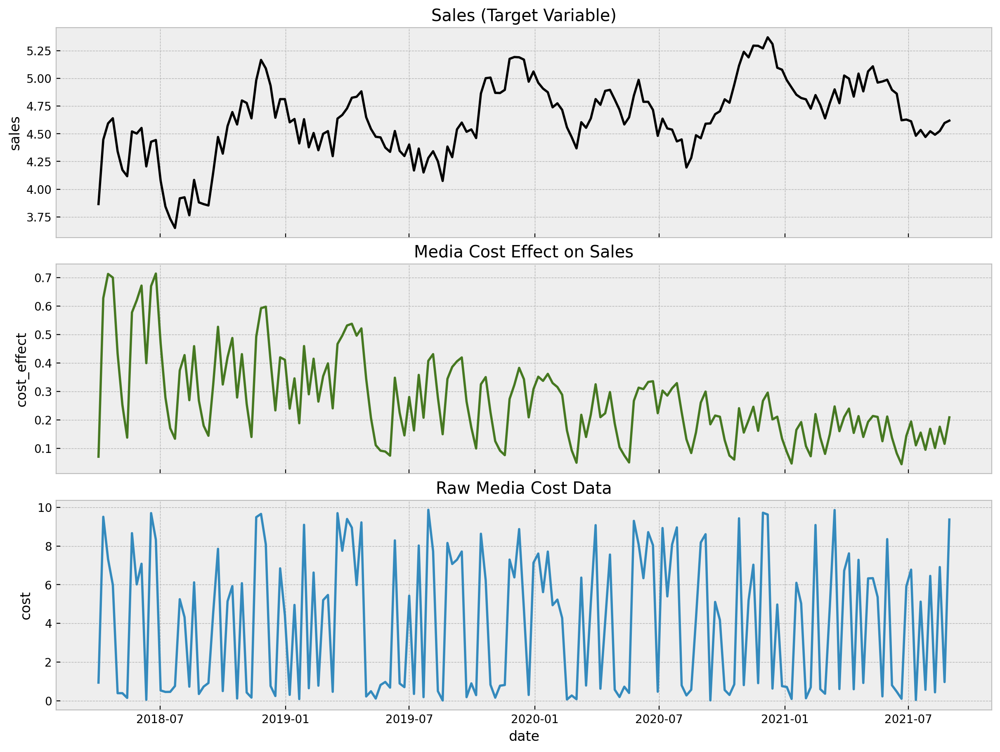

In [9]:
fig, ax = plt.subplots(
    nrows=3,
    ncols=1,
    figsize=(12, 9),
    sharex=True,
    sharey=False,
    layout="constrained"
)
sns.lineplot(x="date", y="sales", color="black", data=data_df, ax=ax[0])
ax[0].set(title="Sales (Target Variable)")
sns.lineplot(x="date", y="cost_effect", color="C3", data=data_df, ax=ax[1])
ax[1].set(title="Media Cost Effect on Sales")
sns.lineplot(x="date", y="cost", data=data_df, ax=ax[2])
ax[2].set(title="Raw Media Cost Data");

1. The first plot is our target variable `sales`, which can represent sales data, for example.
2. The second plot is the `cost_effect` variable, which is the simulated effect of the media spent variable `cost` on the variable `sales`. **In practice we do not know `cost_effect`. We would like to infer it from the data!**
3. The last plot represent the input data `cost` which is something we have control of.

Note that the variable `sales` has a trend and strong (additive) yearly seasonality components.

## Features

We of course do not want to use the trend os seasonal components from  the `data_df` dataframe, as the whole point id to learn them tom the data. Hence, let us keep the variables we would actually have in when developing the model.

In [10]:
columns_to_keep = ["index", "date", "year", "month", "dayofyear", "cost", "sales"]

df = data_df[columns_to_keep].copy()

Next, we generate input features to model the trend and seasonal components. We follow the strategy presented in the very comprehensive post [Air passengers - Prophet-like model](https://docs.pymc.io/en/stable/pymc-examples/examples/time_series/Air_passengers-Prophet_with_Bayesian_workflow.html) from the [`pymc-examples`](https://docs.pymc.io/en/stable/pymc-examples/README.html) repository (please check it out!).

In [11]:
date = df["date"].to_numpy()
date_index = df.index
sales = df["sales"].to_numpy()
cost = df["cost"].to_numpy()
n_obs = sales.size

### Scaling

We scale both the target variable `sales` and the channel input `cost` using a [`MaxAbsScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MaxAbsScaler.html). During the whole analysis we carefully study the effect of these scalers and describe how to recover back the predictions and effects in the original scale.

**Remark:** One would be tempted to use a [`MinMaxScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html) here. However, this would lead to a problem when computing the
(m)ROAS (see more details below). The reason is that for the ROAS computation we want to set the media cost to $0$ (in the raw data
scale!) and generate in-sample predictions. The problem comes when the media data never reaches $0$. In this case,
when using a [`MaxAbsScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MaxAbsScaler.html), the zero value of the transformed variable represents the minimum value of the
original variable. Hence, when setting the media cost to $0$, the transformed variable would be less than zero.
This itself not a problem, but since most og the times we are restricting the regression coefficients of the
media variables to be positive (e.g. via a [`pm.HalfNormal`](https://www.pymc.io/projects/docs/en/latest/api/distributions/generated/pymc.HalfNormal.html) prior) then the media contribution of in the ROAS computation would be negative! This of course does not make sense. Hence, we use a [`MaxAbsScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MaxAbsScaler.html) here, which
ensures that the zero in the transformed variable is the zero in the original variable.

In [12]:
sales_scaler = MaxAbsScaler()
sales_scaler.fit(sales.reshape(-1, 1))
sales_scaled = sales_scaler.transform(sales.reshape(-1, 1)).flatten()

cost_scaler = MaxAbsScaler()
cost_scaler.fit(cost.reshape(-1, 1))
cost_scaled = cost_scaler.transform(cost.reshape(-1, 1)).flatten()

## Models

In this section we fit $3$ models, from simpler to complex:
1. **Base Model:** We fit a linear regression model with a single regressor `cost` and controlling from trend ans seasonality.

2. **Adstock-Saturation Model:** We use the same model structure as the base model but we now apply the (geometric) adstock and saturation transformations to the `cost` variable. We **do not** set a value for $\alpha$ and $\lambda$ as we learn them from the data. We do fix the variable $\ell=12$ of the adstock transformation.

3. **Adstock-Saturation-Diminishing Returns Model:** We use the same model structure as the Adstock-Saturation model but we allow a time-varying coefficient for (the transformed) `cost` by modeling it as a gaussian random walk.

Here are some comments on the models:

- We use a [`pm.HalfNormal`](https://www.pymc.io/projects/docs/en/latest/api/distributions/generated/pymc.HalfNormal.html) distribution for the media coefficients to ensure they are positive.
- We use a [`pm.Laplace`](https://docs.pymc.io/en/latest/api/distributions/generated/pymc.Laplace.html) distribution fot the fourier coefficient to add certain regularization (these features can easily lead to an overfit).
- For the likelihood function we use a [`pm.StudentT`](https://www.pymc.io/projects/docs/en/latest/api/distributions/generated/pymc.StudentT.html) distribution which is most robust against outliers.

### Base Model

Let us start by defining the structure of the base model, which is the be the core of the models to come.

- Model Specification

In [13]:
coords = {"date": date}

with pm.Model(coords=coords) as base_model:
    # --- data containers ---
    cost_scaled_ = pm.MutableData(name="cost_scaled", value=cost_scaled, dims="date")

    # --- priors ---
    ## intercept
    a = pm.Normal(name="a", mu=0, sigma=4)
    ## regressor
    b_cost = pm.HalfNormal(name="b_cost", sigma=2)
    ## standard deviation of the normal likelihood
    sigma = pm.HalfNormal(name="sigma", sigma=0.5)
    # degrees of freedom of the t distribution
    nu = pm.Gamma(name="nu", alpha=25, beta=2)

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/data.py:304: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(


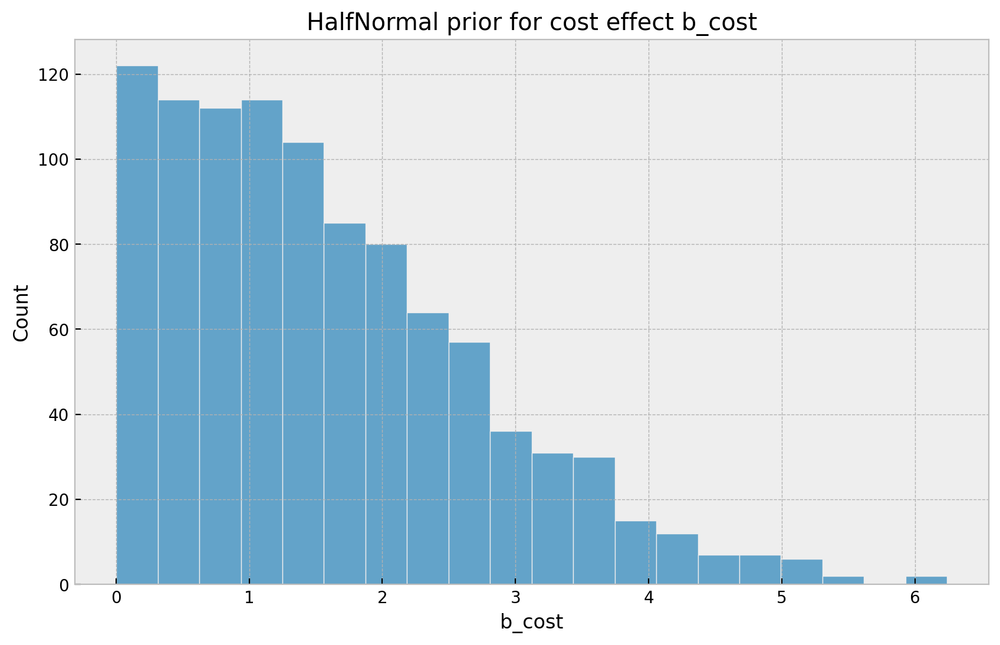

In [14]:
sns.histplot(pm.draw(b_cost, draws=1000));
plt.title("HalfNormal prior for cost effect b_cost"); plt.xlabel("b_cost");

Sampling: [a, b_cost, likelihood, nu, sigma]


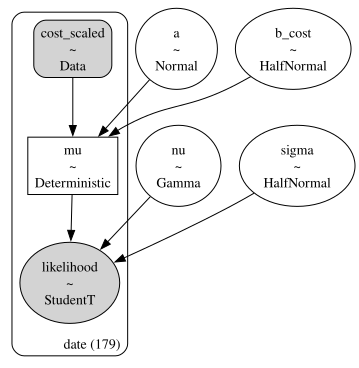

In [15]:
with base_model:
    # --- model parametrization ---
    mu = pm.Deterministic(name="mu", var=a + b_cost * cost_scaled_, dims="date")

    # --- likelihood ---
    pm.StudentT(name="likelihood", nu=nu, mu=mu, sigma=sigma, observed=sales_scaled, dims="date")

    # --- prior samples ---
    base_model_prior_predictive = pm.sample_prior_predictive()

pm.model_to_graphviz(model=base_model)

### Posterior sampling

In [16]:
with base_model:
    base_model_trace = pm.sample(
        nuts_sampler="numpyro",
        draws=6000,
        chains=4,
        idata_kwargs={"log_likelihood": True},
        progressbar=False,
    )
    base_model_posterior_predictive = pm.sample_posterior_predictive(
        trace=base_model_trace
    )

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Sampling: [likelihood]


/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

### Model checking

In [17]:
az.summary(
    data=base_model_trace,
    var_names=["a", "b_cost", "sigma", "nu"],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,0.843,0.007,0.829,0.856,0.000,0.000,14108.0,14029.0,1.0
b_cost,0.052,0.013,0.028,0.076,0.000,0.000,12966.0,10499.0,1.0
sigma,0.057,0.003,0.050,0.063,0.000,0.000,19814.0,14815.0,1.0
nu,13.038,2.475,8.512,17.607,0.018,0.013,18664.0,14926.0,1.0


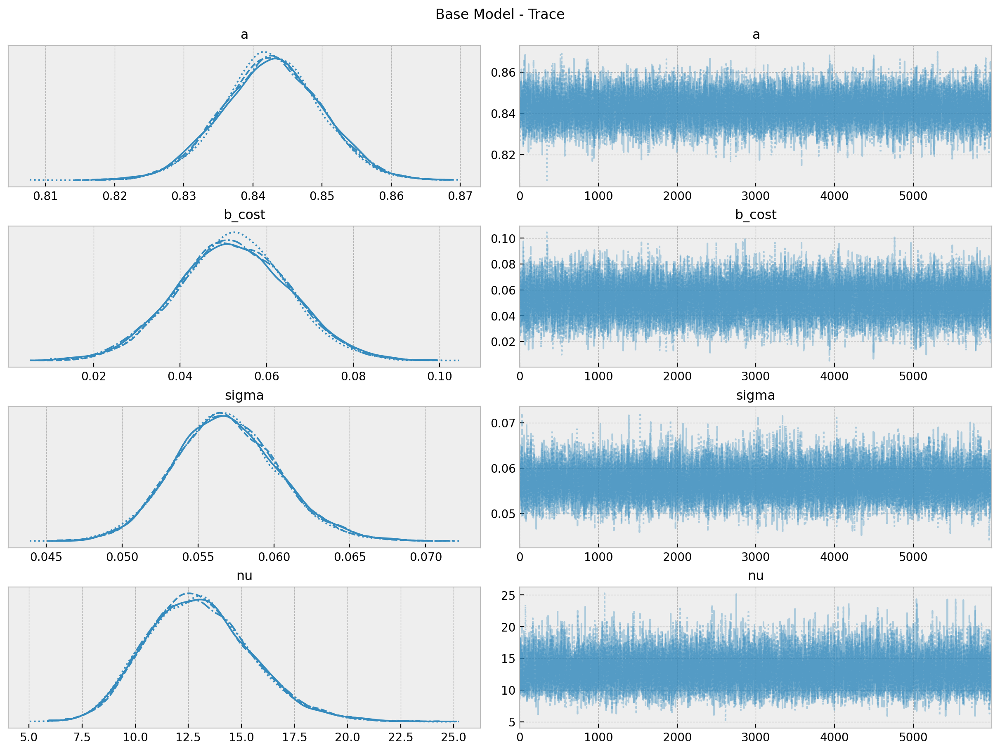

In [18]:
axes = az.plot_trace(
    data=base_model_trace,
    var_names=["a", "b_cost", "sigma", "nu"],
    compact=True,
    backend_kwargs={
        "figsize": (12, 9),
        "layout": "constrained"
    },
)
fig = axes[0][0].get_figure()
fig.suptitle("Base Model - Trace");

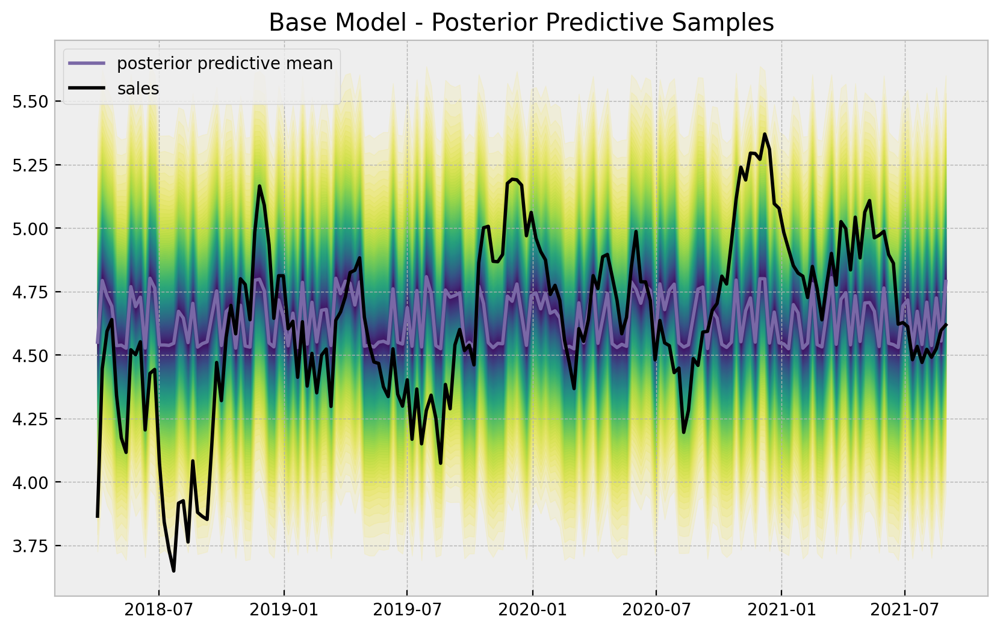

In [20]:
# useful way to color the distribution
palette = "viridis_r"
cmap = plt.get_cmap(palette)
percs = np.linspace(51, 99, 100)
colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))

posterior_predictive_likelihood = az.extract(
    data=base_model_posterior_predictive,
    group="posterior_predictive",
    var_names="likelihood",
)

posterior_predictive_likelihood_inv = sales_scaler.inverse_transform(
    X=posterior_predictive_likelihood
)

fig, ax = plt.subplots()

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(posterior_predictive_likelihood_inv, p, axis=1)
    lower = np.percentile(posterior_predictive_likelihood_inv, 100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(
        x=date,
        y1=upper,
        y2=lower,
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(
    x=date,
    y=posterior_predictive_likelihood_inv.mean(axis=1),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)
sns.lineplot(
    x=date,
    y=sales,
    color="black",
    label="sales",
    ax=ax,
)
ax.legend(loc="upper left")
ax.set(title="Base Model - Posterior Predictive Samples");

## Model improvement: Trend + Seasonality model

Our model is not doing a great job reproducing the data. Two critical components that are missing are a linear trend as well as seasonality.

### Trend

For the trend component we simply use a linear feature (which we scale  between $0$ and $1$).

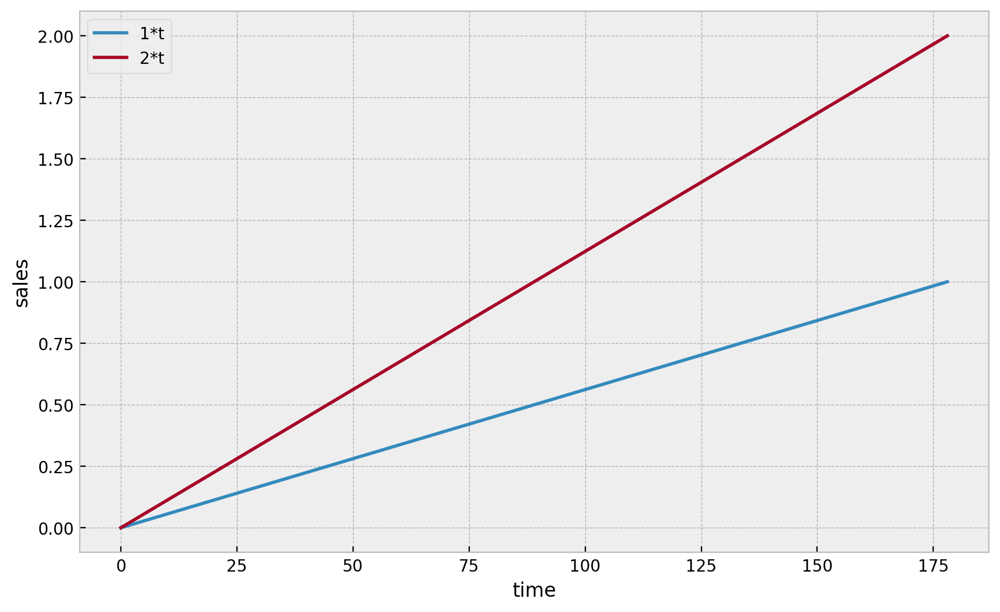

In [21]:
t = ((df.index - df.index.min()) / (df.index.max() - df.index.min())).values
plt.plot(t, label="1*t"); plt.plot(2*t, label="2*t"); plt.xlabel("time"); plt.ylabel("sales"); plt.legend();

### Seasonality

To model the seasonality, we use [Fourier modes](https://en.wikipedia.org/wiki/Fourier_series) (similarly as in Prophet or Orbit).

In [22]:
n_order = 7
periods = df["dayofyear"] / 365.25
fourier_features = pd.DataFrame(
    {
        f"{func}_order_{order}": getattr(np, func)(2 * np.pi * periods * order)
        for order in range(1, n_order + 1)
        for func in ("sin", "cos")
    }
)

We can see how these cyclic features look like:

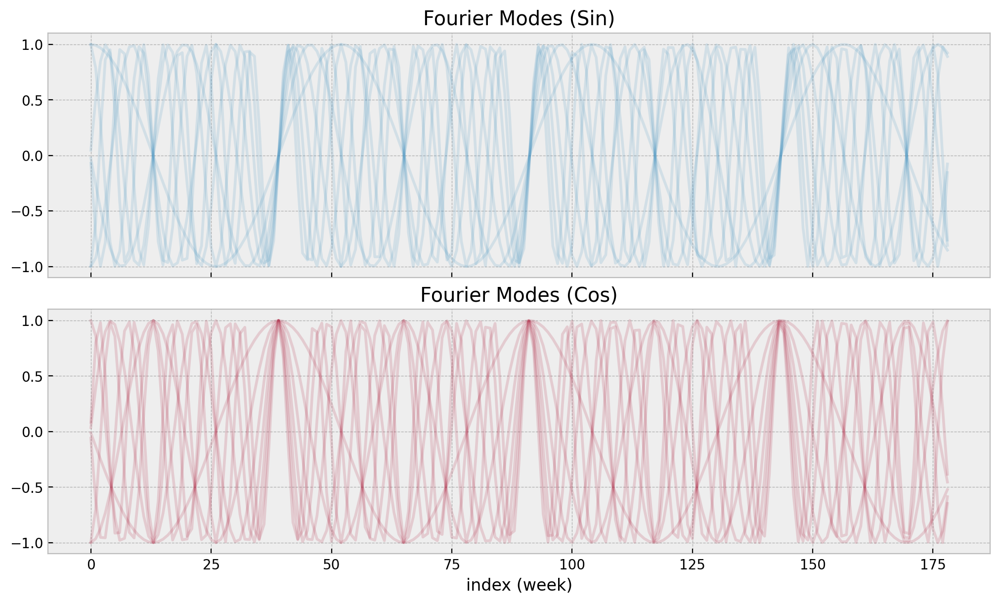

In [23]:
fig, ax = plt.subplots(nrows=2, sharex=True, layout="constrained")
fourier_features.filter(like="sin").plot(color="C0", alpha=0.15, ax=ax[0])
ax[0].get_legend().remove()
ax[0].set(title="Fourier Modes (Sin)", xlabel="index (week)")
fourier_features.filter(like="cos").plot(color="C1", alpha=0.15, ax=ax[1])
ax[1].get_legend().remove()
ax[1].set(title="Fourier Modes (Cos)", xlabel="index (week)");

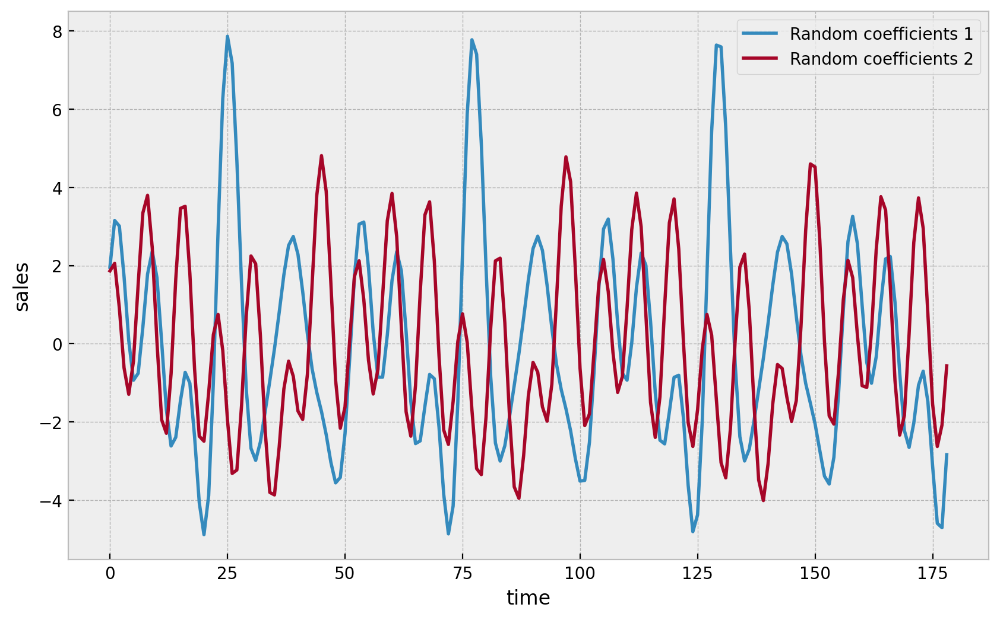

In [24]:
seasonal_pattern1 = fourier_features @ np.random.randn(len(fourier_features.columns))
plt.plot(seasonal_pattern1, label="Random coefficients 1"); 
seasonal_pattern2 = fourier_features @ np.random.randn(len(fourier_features.columns))
plt.plot(seasonal_pattern2, label="Random coefficients 2"); 

plt.xlabel("time"); plt.ylabel("sales"); plt.legend();

In [25]:
coords = {"date": date, "fourier_mode": np.arange(2 * n_order)}

with pm.Model(coords=coords) as trend_seasonal_model:
    # --- data containers ---
    cost_scaled_ = pm.MutableData(name="cost_scaled", value=cost_scaled, dims="date")

    # --- priors ---
    ## intercept
    a = pm.Normal(name="a", mu=0, sigma=4)
    ## trend
    b_trend = pm.Normal(name="b_trend", mu=0, sigma=2)
    ## seasonality
    b_fourier = pm.Laplace(name="b_fourier", mu=0, b=2, dims="fourier_mode")
    ## regressor
    b_cost = pm.HalfNormal(name="b_cost", sigma=2)
    ## standard deviation of the normal likelihood
    sigma = pm.HalfNormal(name="sigma", sigma=0.5)
    # degrees of freedom of the t distribution
    nu = pm.Gamma(name="nu", alpha=25, beta=2)

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/data.py:304: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(


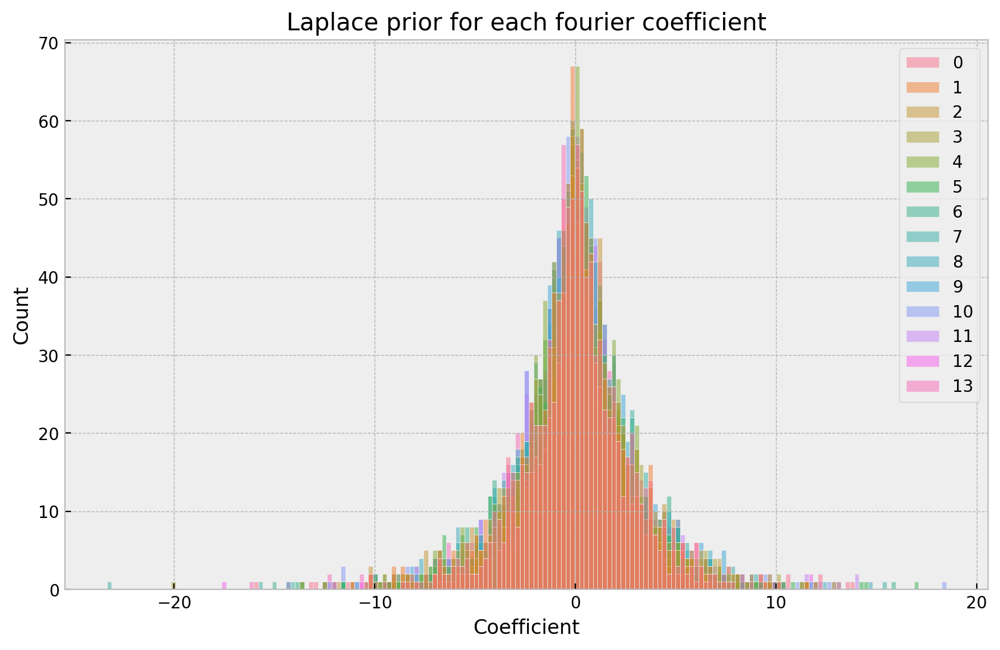

In [26]:
sns.histplot(pm.draw(b_fourier, draws=1000));
plt.title("Laplace prior for each fourier coefficient"); plt.xlabel("Coefficient");

Sampling: [a, b_cost, b_fourier, b_trend, likelihood, nu, sigma]


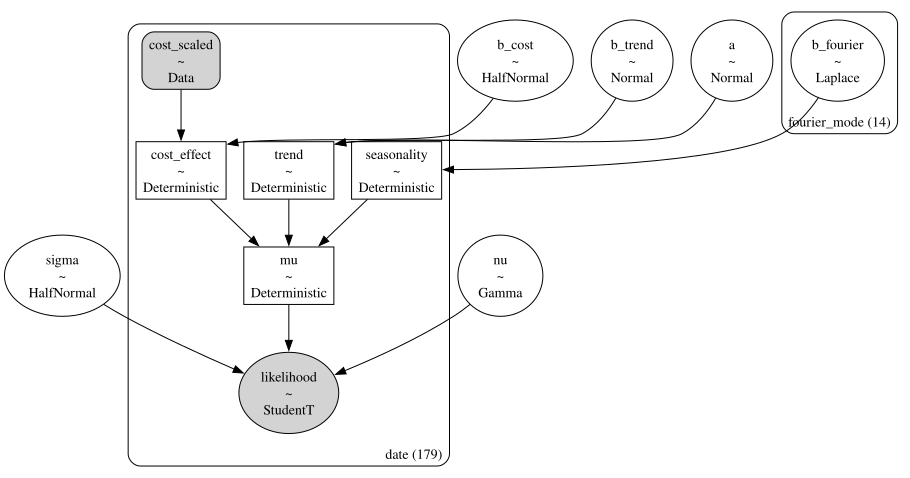

In [27]:
with trend_seasonal_model:
    # --- model parameterization ---
    trend = pm.Deterministic(name="trend", var=a + b_trend * t, dims="date")
    seasonality = pm.Deterministic(
        name="seasonality", var=pm.math.dot(fourier_features, b_fourier), dims="date"
    )
    cost_effect = pm.Deterministic(name="cost_effect", var=b_cost * cost_scaled_, dims="date")

    # Putting it all together
    mu = pm.Deterministic(name="mu", var=trend + seasonality + cost_effect, dims="date")

    # --- likelihood ---
    pm.StudentT(name="likelihood", nu=nu, mu=mu, sigma=sigma, observed=sales_scaled, dims="date")

    # --- prior samples ---
    trend_seasonal_model_prior_predictive = pm.sample_prior_predictive()

pm.model_to_graphviz(model=trend_seasonal_model)

- Prior Predictive Samples

Let us start by sampling from the model before looking into the data:

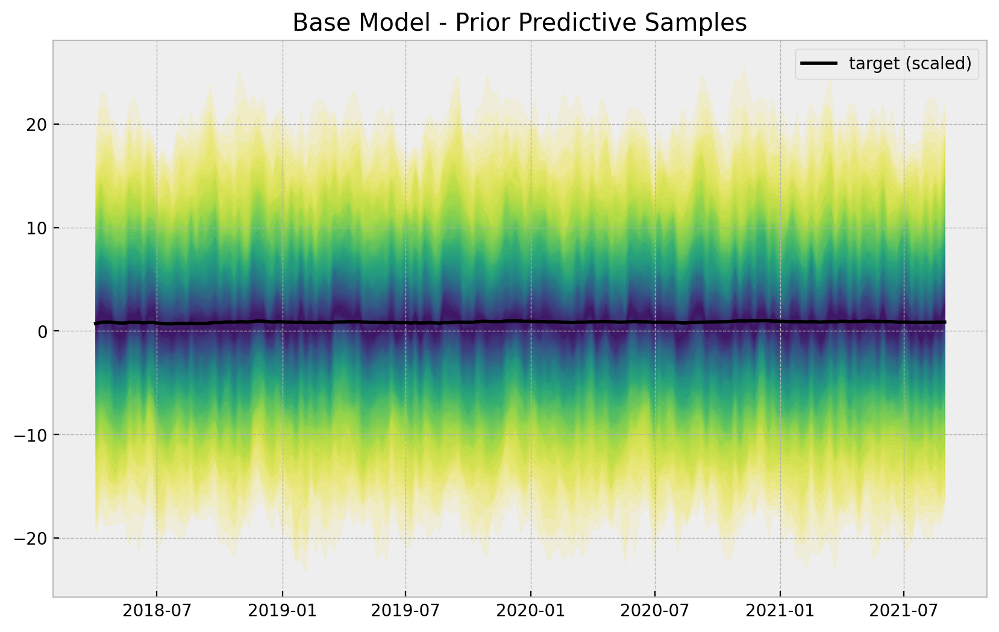

In [28]:
fig, ax = plt.subplots()

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(trend_seasonal_model_prior_predictive.prior_predictive["likelihood"], p, axis=1)
    lower = np.percentile(
        trend_seasonal_model_prior_predictive.prior_predictive["likelihood"], 100 - p, axis=1
    )
    color_val = colors[i]
    ax.fill_between(
        x=date,
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(x=date, y=sales_scaled, color="black", label="target (scaled)", ax=ax)
ax.legend()
ax.set(title="Base Model - Prior Predictive Samples");

The priors do constrain the range of the generated time series. Nevertheless, they are not too restrictive.

**Remark:** Note that the prior predictive shows the possibility of having *negative sales* which makes no sense. A common approach is to model the logarithm of the sales instead. We do not do this here for the sake of simplicity (specially when interpreting the results).

- Fit Model

In [29]:
with trend_seasonal_model:
    trend_seasonal_model_trace = pm.sample(
        nuts_sampler="numpyro",
        draws=6000,
        chains=4,
        idata_kwargs={"log_likelihood": True},
        progressbar=False,
    )
    trend_seasonal_model_posterior_predictive = pm.sample_posterior_predictive(
        trace=trend_seasonal_model_trace
    )

Sampling: [likelihood]


/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

**Remark:** We add the argument `idata_kwargs={"log_likelihood": True}` since we want to compare various models using [`az.compare`](https://python.arvicost.org/en/latest/api/generated/arvicost.compare.html). See [this issue](https://github.com/arviz-devs/arviz/issues/2155) for more details.

- Model Diagnostics

In [30]:
az.summary(
    data=trend_seasonal_model_trace,
    var_names=["a", "b_trend", "b_cost", "sigma", "nu"],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,0.788,0.003,0.782,0.793,0.000,0.000,8967.0,12031.0,1.0
b_trend,0.119,0.005,0.110,0.127,0.000,0.000,11214.0,13886.0,1.0
b_cost,0.049,0.004,0.042,0.056,0.000,0.000,9479.0,11756.0,1.0
sigma,0.016,0.001,0.014,0.018,0.000,0.000,10445.0,12935.0,1.0
nu,12.507,2.409,8.168,17.043,0.022,0.016,11245.0,12234.0,1.0


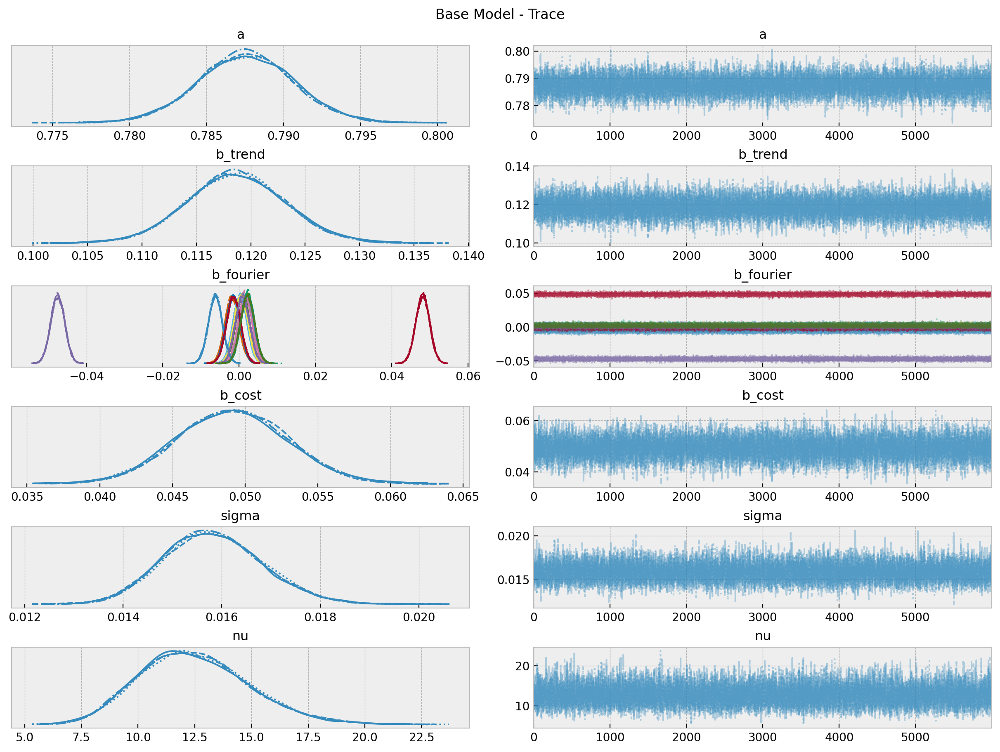

In [31]:
axes = az.plot_trace(
    data=trend_seasonal_model_trace,
    var_names=["a", "b_trend", "b_fourier", "b_cost", "sigma", "nu"],
    compact=True,
    backend_kwargs={
        "figsize": (12, 9),
        "layout": "constrained"
    },
)
fig = axes[0][0].get_figure()
fig.suptitle("Base Model - Trace");

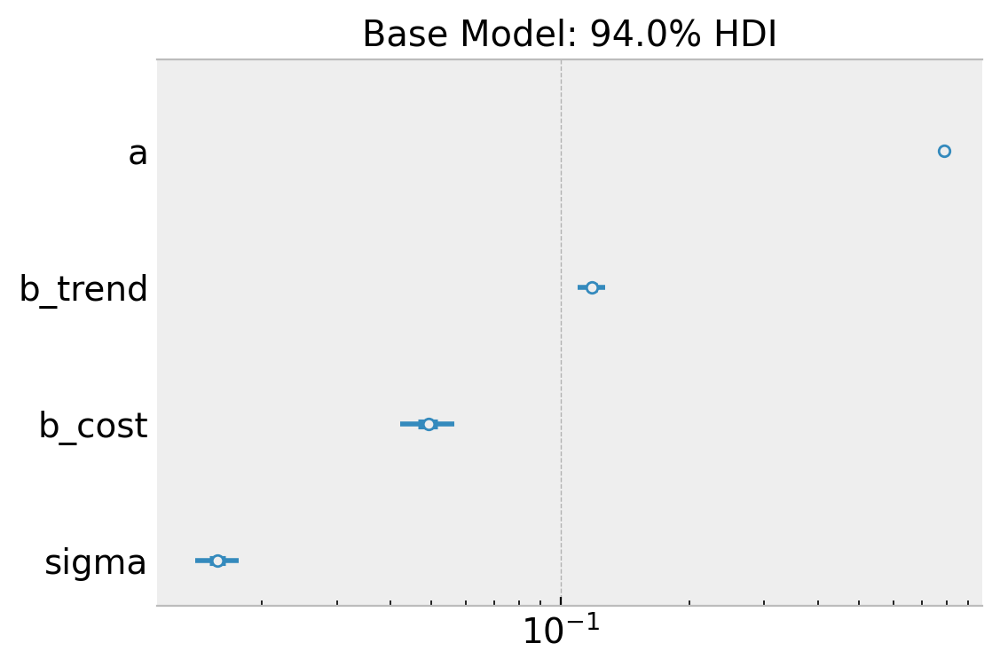

In [32]:
fig, ax = plt.subplots(figsize=(6, 4))
az.plot_forest(
    data=trend_seasonal_model_trace,
    var_names=["a", "b_trend", "b_cost", "sigma"],
    combined=True,
    ax=ax
)
ax.set(
    title="Base Model: 94.0% HDI",
    xscale="log"
);

Overall, the model looks ok!

- Posterior Predictive Samples

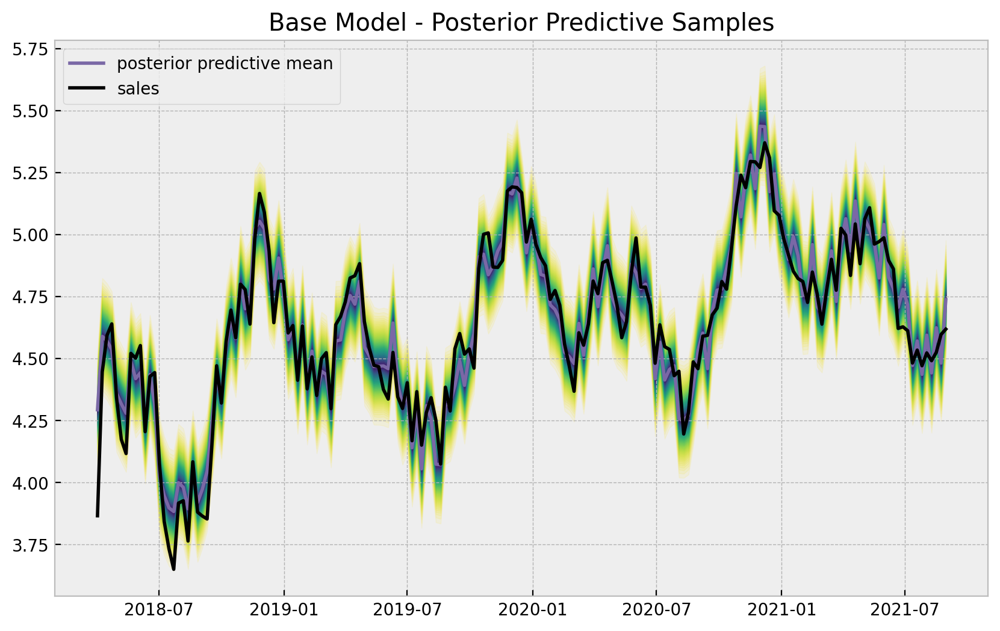

In [33]:
posterior_predictive_likelihood = az.extract(
    data=trend_seasonal_model_posterior_predictive,
    group="posterior_predictive",
    var_names="likelihood",
)

posterior_predictive_likelihood_inv = sales_scaler.inverse_transform(
    X=posterior_predictive_likelihood
)

fig, ax = plt.subplots()

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(posterior_predictive_likelihood_inv, p, axis=1)
    lower = np.percentile(posterior_predictive_likelihood_inv, 100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(
        x=date,
        y1=upper,
        y2=lower,
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(
    x=date,
    y=posterior_predictive_likelihood_inv.mean(axis=1),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)
sns.lineplot(
    x=date,
    y=sales,
    color="black",
    label="sales",
    ax=ax,
)
ax.legend(loc="upper left")
ax.set(title="Base Model - Posterior Predictive Samples");

The trend-seasonal model captures the trend and seasonality of the data. We can now plot the model components:

<>:13: SyntaxWarning: invalid escape sequence '\%'
<>:13: SyntaxWarning: invalid escape sequence '\%'
/var/folders/mn/0x4pxw0n61lf479ndp07r0gr0000gn/T/ipykernel_97806/2653330100.py:13: SyntaxWarning: invalid escape sequence '\%'
  label=f"$94\%$ HDI ({var_effect})",


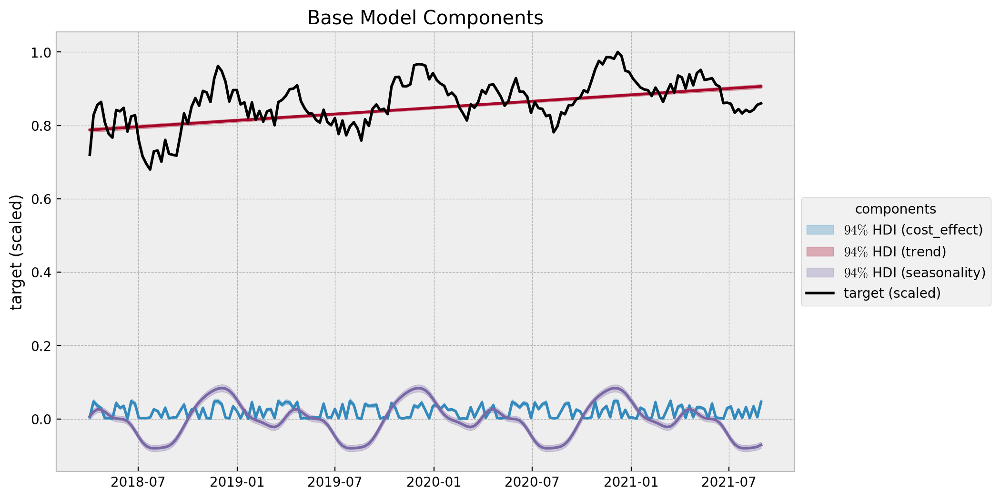

In [34]:
# compute HDI for all the model parameters
model_hdi = az.hdi(ary=trend_seasonal_model_trace)

fig, ax = plt.subplots()

for i, var_effect in enumerate(["cost_effect", "trend", "seasonality"]):
    ax.fill_between(
        x=date,
        y1=model_hdi[var_effect][:, 0],
        y2=model_hdi[var_effect][:, 1],
        color=f"C{i}",
        alpha=0.3,
        label=f"$94\%$ HDI ({var_effect})",
    )
    sns.lineplot(
        x=date,
        y=trend_seasonal_model_trace.posterior[var_effect]
        .stack(sample=("chain", "draw"))
        .mean(axis=1),
        color=f"C{i}",
    )

sns.lineplot(x=date, y=sales_scaled, color="black", alpha=1.0, label="target (scaled)", ax=ax)
ax.legend(title="components", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Base Model Components", ylabel="target (scaled)");

- Estimated `cost_effect`

Finally, let us look at the estimated effect of `cost` on `sales`.

In [35]:
cost_effect_posterior_samples = xr.apply_ufunc(
    lambda x: cost_scaler.inverse_transform(X=x.reshape(1, -1)),
    trend_seasonal_model_trace.posterior["cost_effect"],
    input_core_dims=[["date"]],
    output_core_dims=[["date"]],
    vectorize=True,
)

cost_effect_hdi = az.hdi(ary=cost_effect_posterior_samples)["cost_effect"]

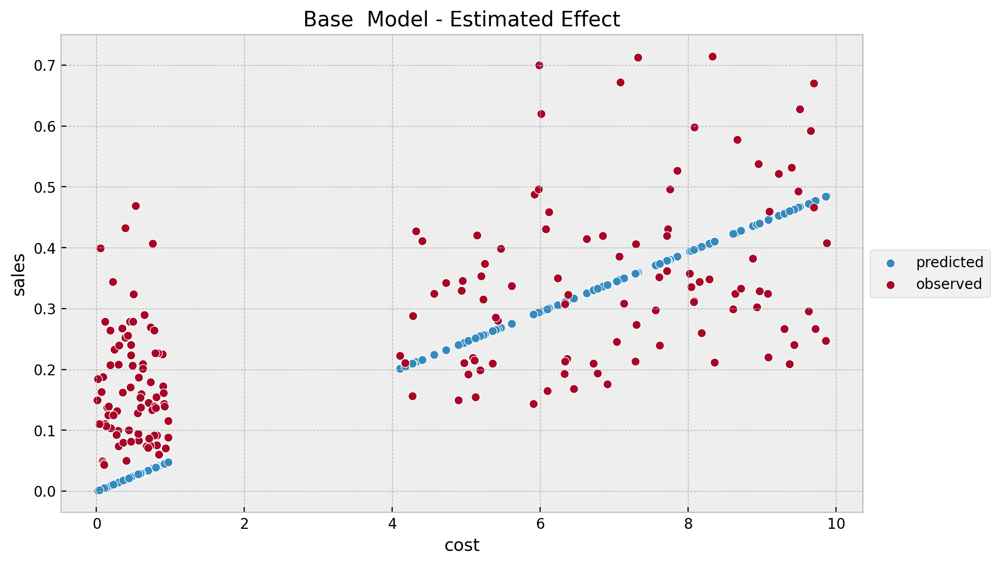

In [36]:
fig, ax = plt.subplots()

sns.scatterplot(
    x="cost",
    y="cost_effect_pred_mean",
    color="C0",
    label="predicted",
    data=data_df.assign(
        cost_effect_pred_mean=cost_effect_posterior_samples.mean(dim=("chain", "draw"))
    ),
    ax=ax,
)
sns.scatterplot(
    x="cost",
    y="cost_effect",
    color="C1",
    label="observed",
    data=data_df,
    ax=ax,
)
h, l = ax.get_legend_handles_labels()
ax.legend(handles=h[:9], labels=l[:9], loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Base  Model - Estimated Effect", ylabel="sales");

Let's next look into the development over time.

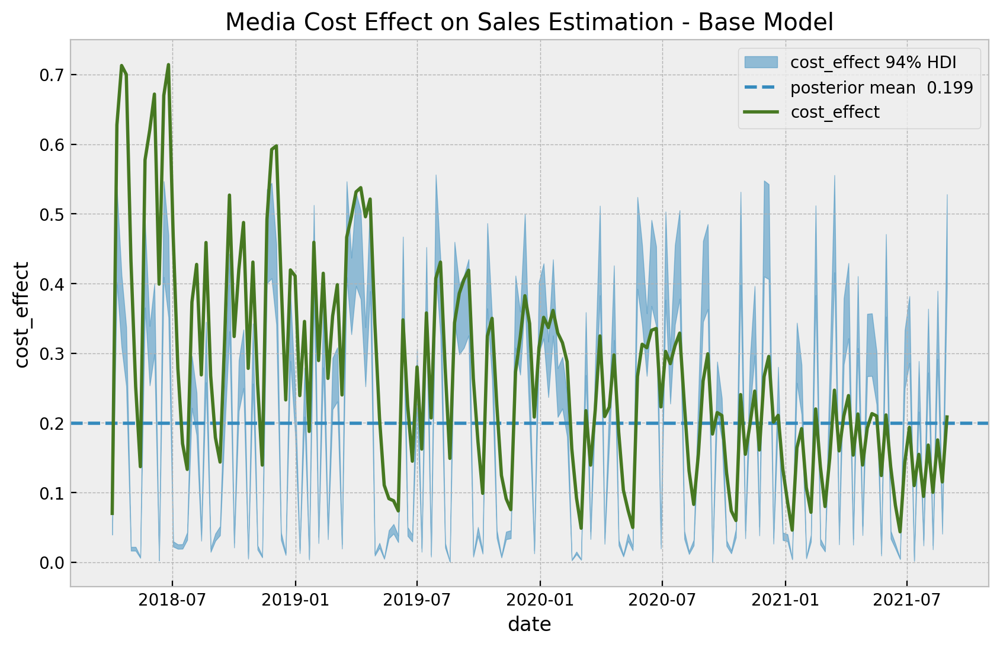

In [37]:
fig, ax = plt.subplots()
ax.fill_between(
    x=date,
    y1=cost_effect_hdi[:, 0],
    y2=cost_effect_hdi[:, 1],
    color="C0",
    alpha=0.5,
    label="cost_effect 94% HDI",
)
ax.axhline(
    y=cost_effect_posterior_samples.mean(),
    color="C0",
    linestyle="--",
    label=f"posterior mean {cost_effect_posterior_samples.mean().values: 0.3f}",
)
sns.lineplot(x="date", y="cost_effect", color="C3", data=data_df, label="cost_effect", ax=ax)
ax.legend(loc="upper right")
ax.set(title="Media Cost Effect on Sales Estimation - Base Model");

We are clearly missing some structure in our model: 
1. The relationship between cost and sales is not modelled correctly.
2. The true cost_effect is changing in variance (and mean) over time. 

---

## Adstock-Saturation Model

For the second model we need to express the (geometric) adstock and saturation transformations as tensor operations:

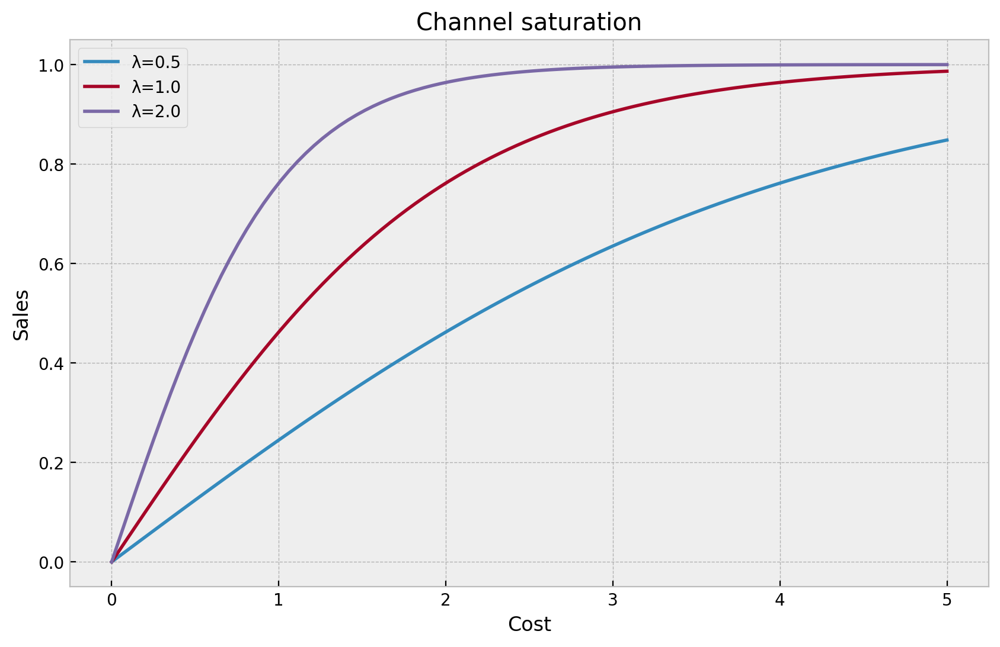

In [38]:
def logistic_saturation_np(x, lam: float = 0.5):
    """Logistic saturation transformation."""
    return (1 - np.exp(-lam * x)) / (1 + np.exp(-lam * x))

xi = np.linspace(0, 5, 100)
plt.plot(xi, logistic_saturation_np(xi, lam=.5), label="λ=0.5")
plt.plot(xi, logistic_saturation_np(xi, lam=1.0), label="λ=1.0")
plt.plot(xi, logistic_saturation_np(xi, lam=2.0), label="λ=2.0")
plt.xlabel("Cost"); plt.ylabel("Sales"); plt.legend(); plt.title("Channel saturation");

### Adstock models delayed effects of advertising
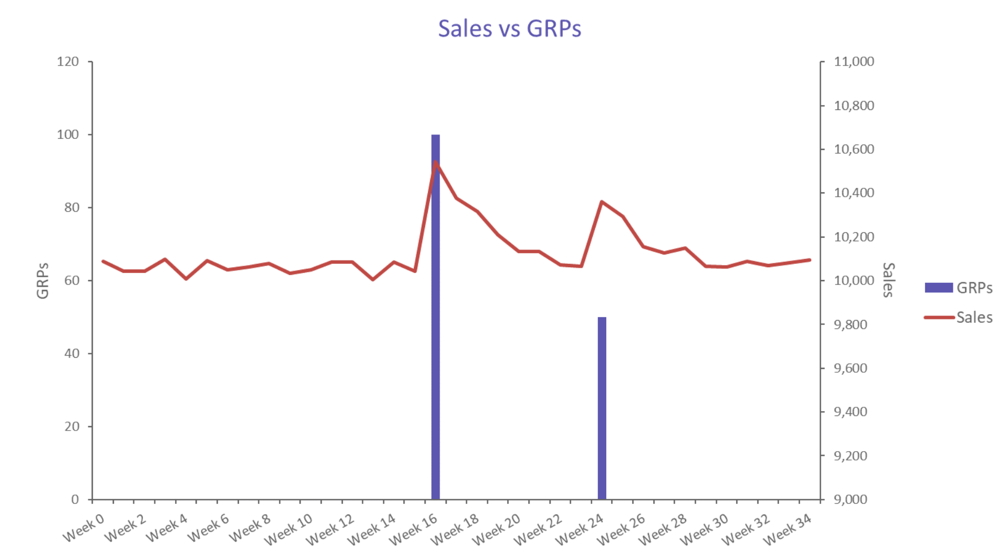
From https://getrecast.com/adstock-rates/

In [39]:
def geometric_adstock(x, alpha: float = 0.0, l_max: int = 12):
    """Geometric adstock transformation."""
    cycles = [
        pt.concatenate(
            [pt.zeros(i), x[: x.shape[0] - i]]
        )
        for i in range(l_max)
    ]
    x_cycle = pt.stack(cycles)
    w = pt.as_tensor_variable([pt.power(alpha, i) for i in range(l_max)])
    return pt.dot(w, x_cycle)


def logistic_saturation(x, lam: float = 0.5):
    """Logistic saturation transformation."""
    return (1 - pt.exp(-lam * x)) / (1 + pt.exp(-lam * x))

- Model Specification

As we want $\alpha$ to be in the interval $(0, 1)$ we use a Beta distribution. Moreover, we choose $\alpha \sim \text{Beta}(1, 1) = \text{Uniform}(0, 1)$ as prior. For $\lambda$ we use a $\text{Gamma}$ distribution as this parameters has to be positive.

In [40]:
with pm.Model(coords=coords) as adstock_saturation_model:
    # --- data containers ---
    cost_scaled_ = pm.MutableData(name="cost_scaled", value=cost_scaled, dims="date")
    
    # --- priors ---
    ## intercept
    a = pm.Normal(name="a", mu=0, sigma=4)
    ## trend
    b_trend = pm.Normal(name="b_trend", mu=0, sigma=2)
    ## seasonality
    b_fourier = pm.Laplace(name="b_fourier", mu=0, b=2, dims="fourier_mode")
    ## regressor
    b_cost = pm.HalfNormal(name="b_cost", sigma=2)
    ## standard deviation of the normal likelihood
    sigma = pm.HalfNormal(name="sigma", sigma=0.5)
    # degrees of freedom of the t distribution
    nu = pm.Gamma(name="nu", alpha=25, beta=2)

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/data.py:304: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(


In [41]:
with adstock_saturation_model:
    ## adstock effect
    alpha = pm.Beta(name="alpha", alpha=1, beta=1)
    ## saturation effect
    lam = pm.Gamma(name="lam", alpha=3, beta=1)

Sampling: [a, alpha, b_cost, b_fourier, b_trend, lam, likelihood, nu, sigma]


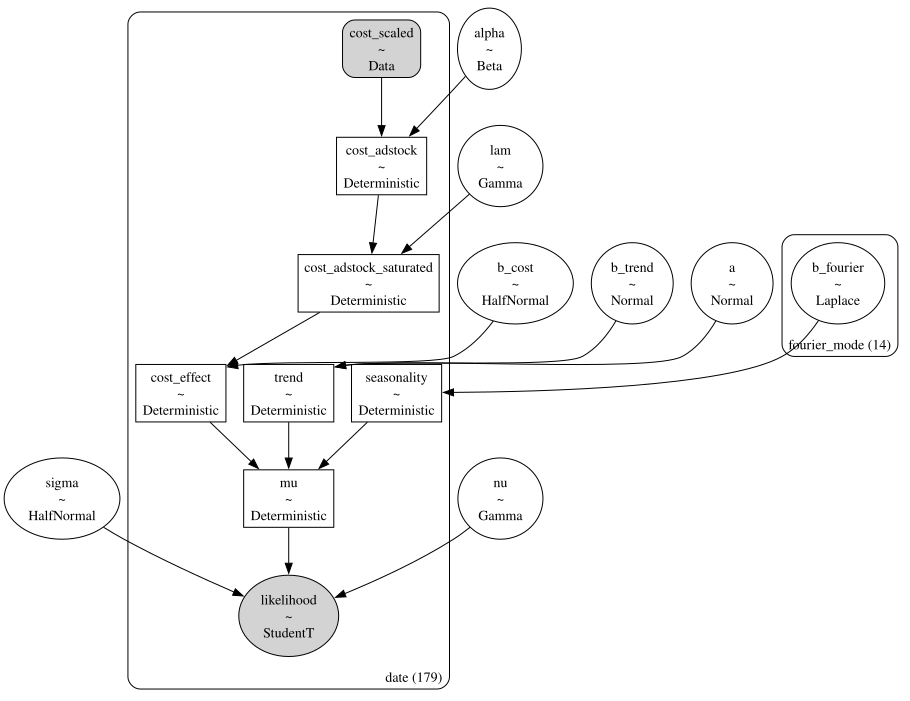

In [42]:
with adstock_saturation_model:
    # --- model parametrization ---
    trend = pm.Deterministic("trend", a + b_trend * t, dims="date")
    seasonality = pm.Deterministic(
        name="seasonality", var=pm.math.dot(fourier_features, b_fourier), dims="date"
    )
    # Adstock and saturation
    cost_adstock = pm.Deterministic(
        name="cost_adstock", var=geometric_adstock(x=cost_scaled_, alpha=alpha, l_max=12), dims="date"
    )
    cost_adstock_saturated = pm.Deterministic(
        name="cost_adstock_saturated",
        var=logistic_saturation(x=cost_adstock, lam=lam),
        dims="date",
    )
    cost_effect = pm.Deterministic(
        name="cost_effect", var=b_cost * cost_adstock_saturated, dims="date"
    )
    mu = pm.Deterministic(name="mu", var=trend + seasonality + cost_effect, dims="date")

    # --- likelihood ---
    pm.StudentT(name="likelihood", nu=nu, mu=mu, sigma=sigma, observed=sales_scaled, dims="date")

    # --- prior samples
    adstock_saturation_model_prior_predictive = pm.sample_prior_predictive()

pm.model_to_graphviz(model=adstock_saturation_model)

- Prior Predictive Samples

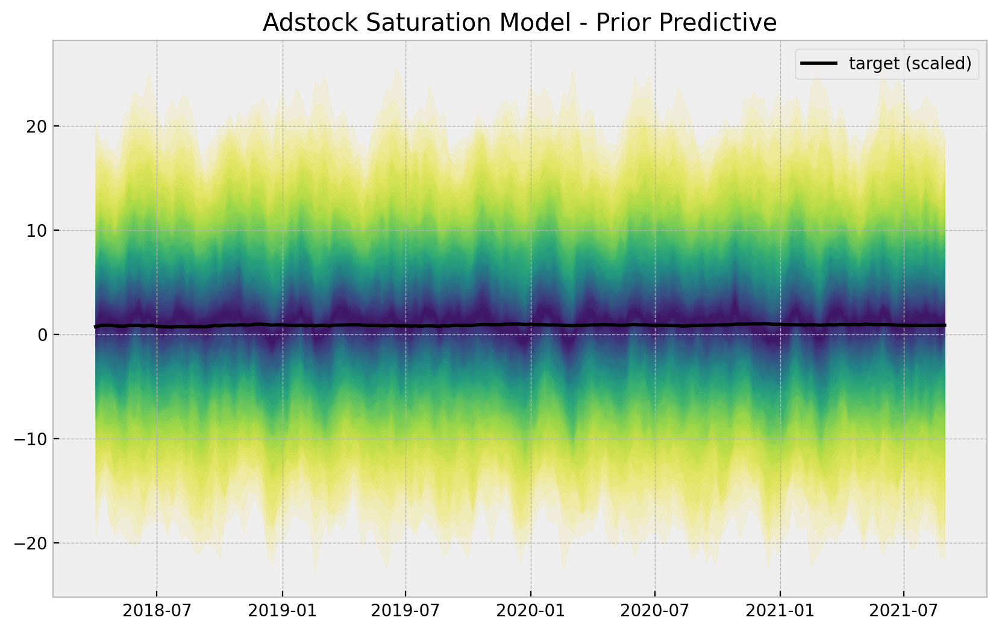

In [43]:
fig, ax = plt.subplots()

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(
        adstock_saturation_model_prior_predictive.prior_predictive["likelihood"],
        p,
        axis=1,
    )
    lower = np.percentile(
        adstock_saturation_model_prior_predictive.prior_predictive["likelihood"], 100 - p, axis=1
    )
    color_val = colors[i]
    ax.fill_between(
        x=date,
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(x=date, y=sales_scaled, color="black", label="target (scaled)", ax=ax)
ax.legend()
ax.set(title="Adstock Saturation Model - Prior Predictive");

- Fit Model

In [44]:
with adstock_saturation_model:
    adstock_saturation_model_trace = pm.sample(
        nuts_sampler="numpyro",
        draws=6000,
        chains=4,
        idata_kwargs={"log_likelihood": True},
        progressbar=False,
    )
    adstock_saturation_model_posterior_predictive = pm.sample_posterior_predictive(
        trace=adstock_saturation_model_trace,
    )

Sampling: [likelihood]


/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

- Model Diagnostics

In [45]:
az.summary(
    data=adstock_saturation_model_trace,
    var_names=["a", "b_trend", "b_cost", "alpha", "lam", "sigma", "nu"]
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,0.751,0.006,0.739,0.763,0.000,0.000,5635.0,9038.0,1.0
b_trend,0.117,0.003,0.111,0.124,0.000,0.000,13547.0,15103.0,1.0
b_cost,0.118,0.018,0.092,0.147,0.000,0.000,4697.0,3792.0,1.0
alpha,0.531,0.034,0.465,0.594,0.000,0.000,5859.0,9140.0,1.0
lam,1.335,0.283,0.815,1.888,0.004,0.003,4697.0,3722.0,1.0
sigma,0.012,0.001,0.010,0.013,0.000,0.000,7748.0,11988.0,1.0
nu,13.337,2.520,8.688,17.974,0.029,0.020,7611.0,11210.0,1.0


We will see later that the values of $\alpha$ and $\lambda$ are very close to the true ones ($0.5$ and $0.15$ respectively) up to a scale defined by the channel scaler. Moreover, the true values (up to this scale) are included in the posterior distributions $94\%$ HDI.

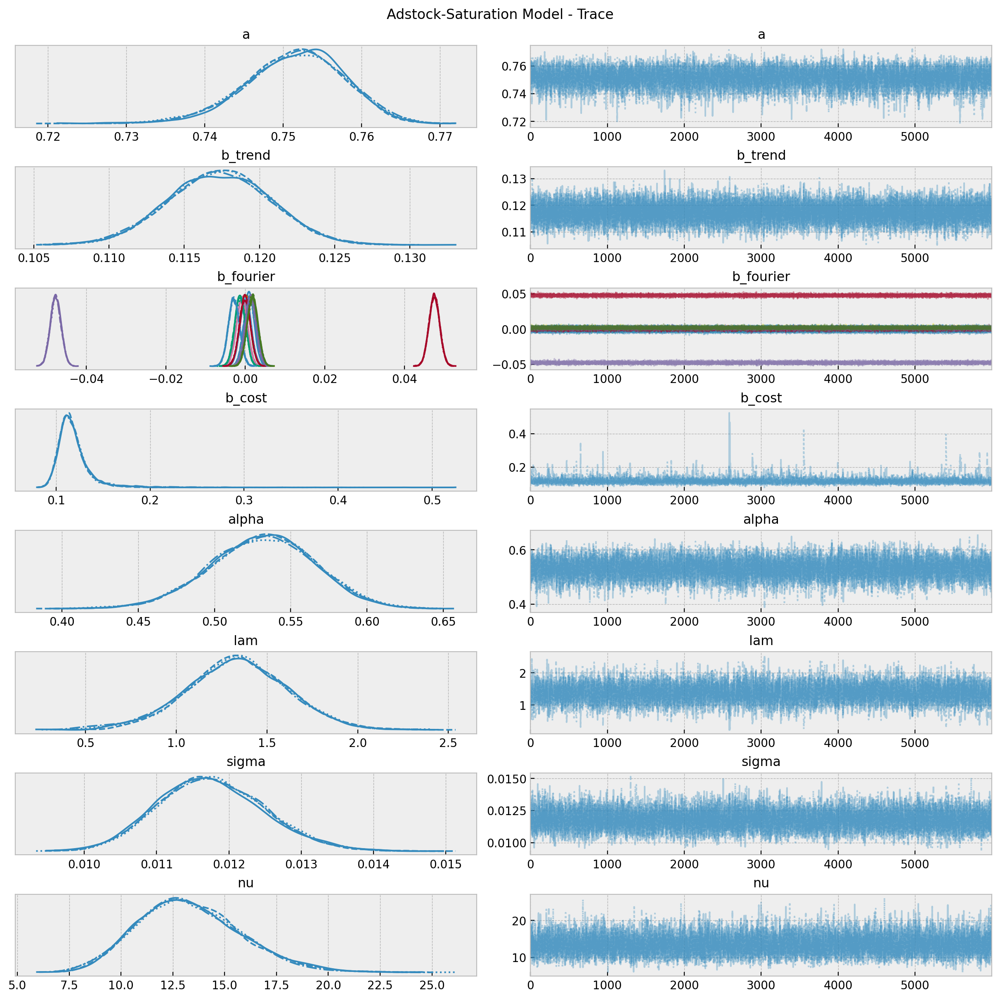

In [46]:
axes = az.plot_trace(
    data=adstock_saturation_model_trace,
    var_names=["a", "b_trend", "b_fourier", "b_cost", "alpha", "lam", "sigma", "nu"],
    compact=True,
    backend_kwargs={
        "figsize": (12, 12),
        "layout": "constrained"
    },
)
fig = axes[0][0].get_figure()
fig.suptitle("Adstock-Saturation Model - Trace");

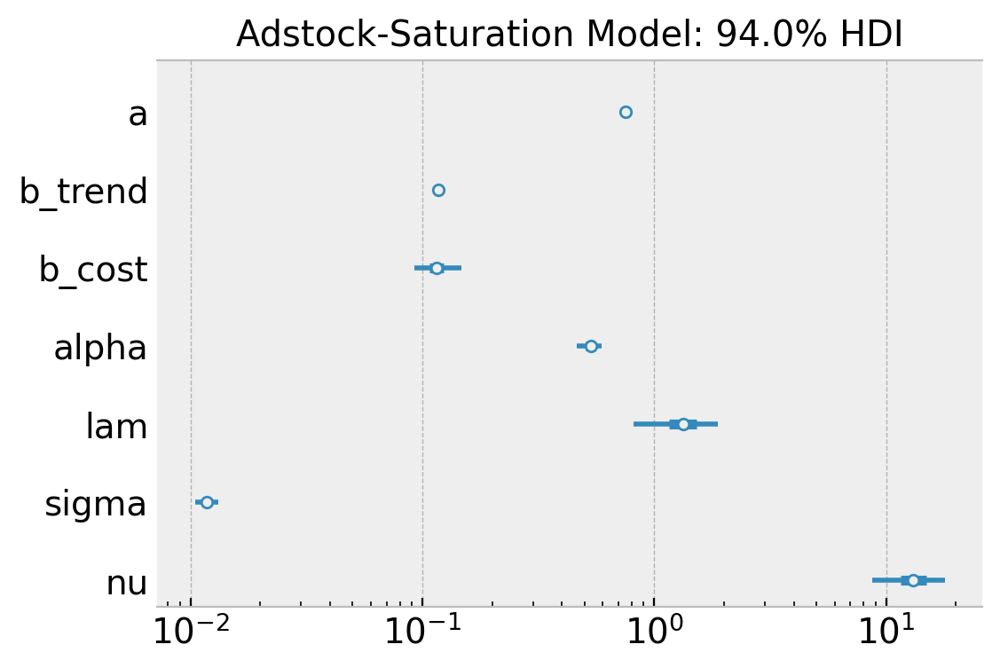

In [47]:
fig, ax = plt.subplots(figsize=(6, 4))
az.plot_forest(
    data=adstock_saturation_model_trace,
    var_names=["a", "b_trend",  "b_cost", "alpha", "lam", "sigma", "nu"],
    combined=True,
    ax=ax
)
ax.set(
    title="Adstock-Saturation Model: 94.0% HDI",
    xscale="log"
);

- Posterior Predictive Samples

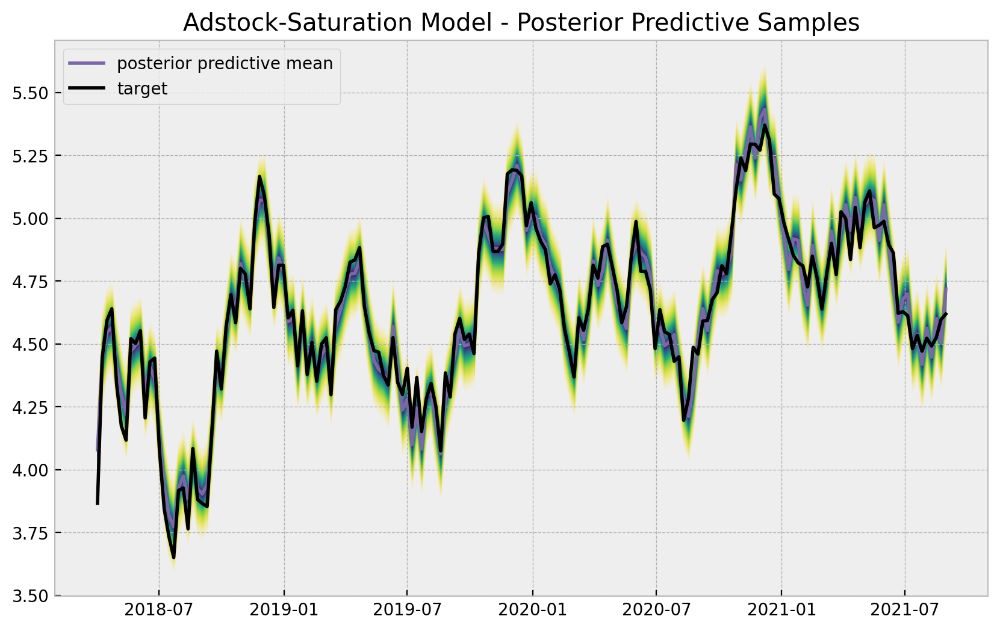

In [48]:
posterior_predictive_likelihood = az.extract(
    data=adstock_saturation_model_posterior_predictive,
    group="posterior_predictive",
    var_names="likelihood",
)

posterior_predictive_likelihood_inv = sales_scaler.inverse_transform(
    X=posterior_predictive_likelihood
)

fig, ax = plt.subplots()

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(posterior_predictive_likelihood_inv, p, axis=1)
    lower = np.percentile(posterior_predictive_likelihood_inv, 100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(
        x=date,
        y1=upper,
        y2=lower,
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(
    x=date,
    y=posterior_predictive_likelihood_inv.mean(axis=1),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)
sns.lineplot(
    x=date,
    y=sales,
    color="black",
    label="target",
    ax=ax,
)
ax.legend(loc="upper left")
ax.set(title="Adstock-Saturation Model - Posterior Predictive Samples");

<>:13: SyntaxWarning: invalid escape sequence '\%'
<>:13: SyntaxWarning: invalid escape sequence '\%'
/var/folders/mn/0x4pxw0n61lf479ndp07r0gr0000gn/T/ipykernel_97806/239419214.py:13: SyntaxWarning: invalid escape sequence '\%'
  label=f"$94\%$ HDI ({var_effect})",


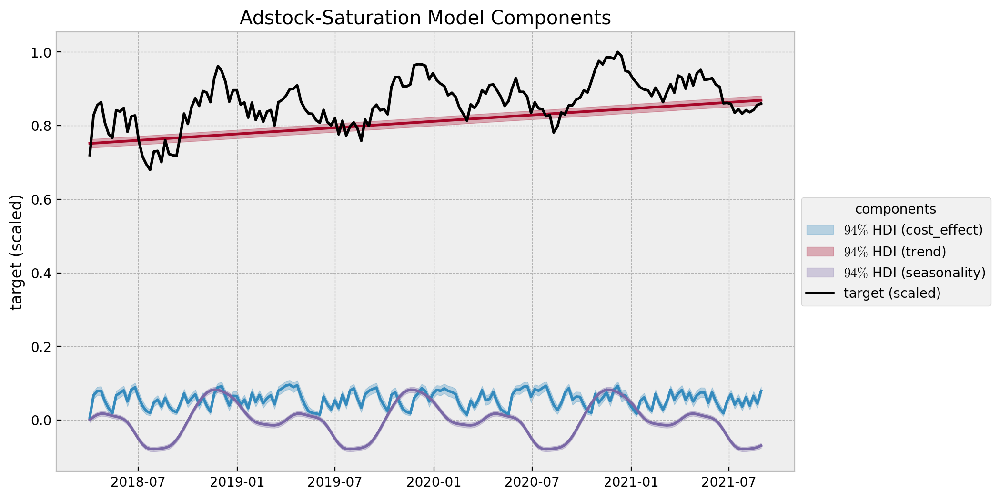

In [49]:
# compute HDI for all the model parameters
model_hdi = az.hdi(ary=adstock_saturation_model_trace)

fig, ax = plt.subplots()

for i, var_effect in enumerate(["cost_effect", "trend", "seasonality"]):
    ax.fill_between(
        x=date,
        y1=model_hdi[var_effect][:, 0],
        y2=model_hdi[var_effect][:, 1],
        color=f"C{i}",
        alpha=0.3,
        label=f"$94\%$ HDI ({var_effect})",
    )
    sns.lineplot(
        x=date,
        y=adstock_saturation_model_trace.posterior[var_effect]
        .stack(sample=("chain", "draw"))
        .mean(axis=1),
        color=f"C{i}",
    )

sns.lineplot(x=date, y=sales_scaled, color="black", alpha=1.0, label="target (scaled)", ax=ax)
ax.legend(title="components", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Adstock-Saturation Model Components", ylabel="target (scaled)");

- Estimated `cost_effect`

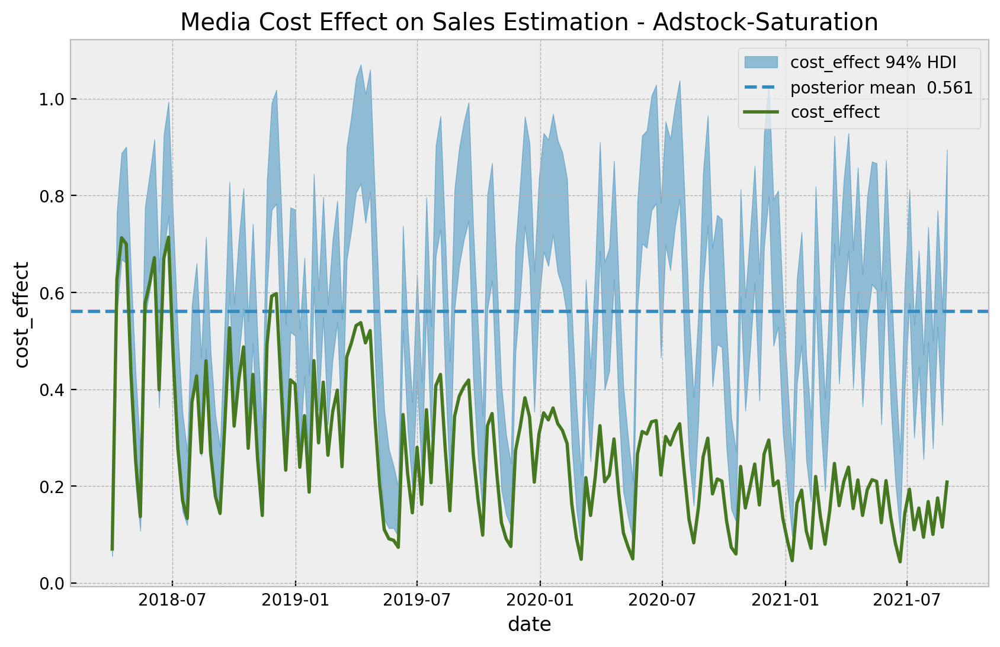

In [50]:
cost_effect_posterior_samples = xr.apply_ufunc(
    lambda x: cost_scaler.inverse_transform(X=x.reshape(1, -1)),
    adstock_saturation_model_trace.posterior["cost_effect"],
    input_core_dims=[["date"]],
    output_core_dims=[["date"]],
    vectorize=True,
)

cost_effect_hdi = az.hdi(ary=cost_effect_posterior_samples)["cost_effect"]
fig, ax = plt.subplots()
ax.fill_between(
    x=date,
    y1=cost_effect_hdi[:, 0],
    y2=cost_effect_hdi[:, 1],
    color="C0",
    alpha=0.5,
    label="cost_effect 94% HDI",
)
ax.axhline(
    y=cost_effect_posterior_samples.mean(),
    color="C0",
    linestyle="--",
    label=f"posterior mean {cost_effect_posterior_samples.mean().values: 0.3f}",
)
sns.lineplot(x="date", y="cost_effect", color="C3", data=data_df, label="cost_effect", ax=ax)
ax.legend(loc="upper right")
ax.set(title="Media Cost Effect on Sales Estimation - Adstock-Saturation");

This model captures more variance in the effect of `cost` than the base model. This shows that the adstock and saturation transformations do make the difference. Note however that the diminishing returns effect is not present in this model, as the regression coefficient is not time-varying.

We continue by looking into the estimated against the true values for this adstock-saturation model. We would expect to find a non-linear patter because of the composition of these two transformations.

---------

## Intermission: PyMC-Marketing

As you can see, this is a lot of code for a classic model that people keep re-using. That's why we from [PyMC Labs](https://www.pymc-labs.com) have release and open-source package called [PyMC-Marketing](https://www.pymc-marketing.io) that automates this. In fact, the above model could equivalently be built with:

In [51]:
from pymc_marketing import mmm

pymc_mmm = mmm.DelayedSaturatedMMM(date_column="date", 
                                   channel_columns=["cost"],
                                   yearly_seasonality=14,
                                   adstock_max_lag=7)
pymc_mmm.fit(data_df, data_df["sales"])

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/model/core.py:518: FutureWarning: All coords are now mutable by default. coords_mutable will be removed in a future release.
  warnings.warn(
/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/model/core.py:988: FutureWarning: Coords are now always mutable. Specifying `mutable` will raise an error in a future release
  warnings.warn(
/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/data.py:304: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(
/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/data.py:304: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 12 seconds.
There were 6 divergences after tuning. Increase `target_accept` or reparameterize.


Inference data with groups:
	> posterior
	> sample_stats
	> observed_data
	> constant_data
	> fit_data

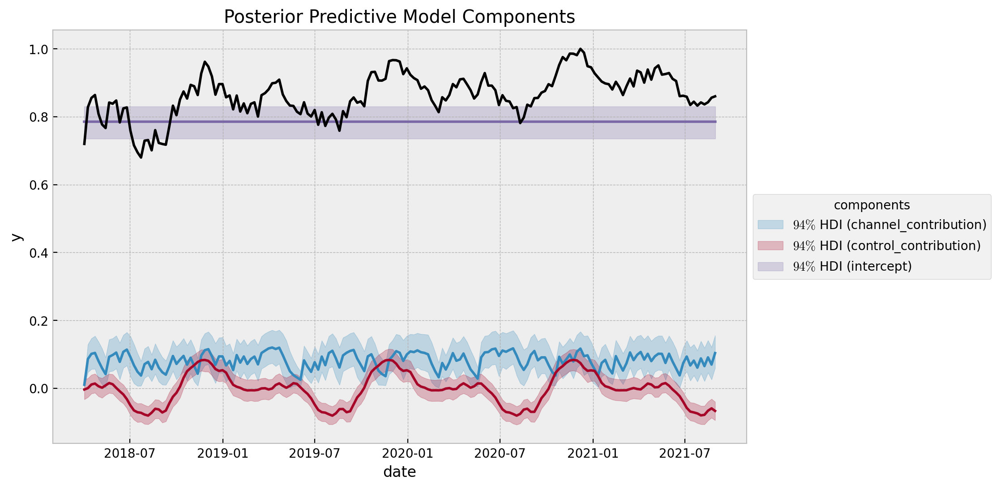

In [52]:
pymc_mmm.plot_components_contributions();

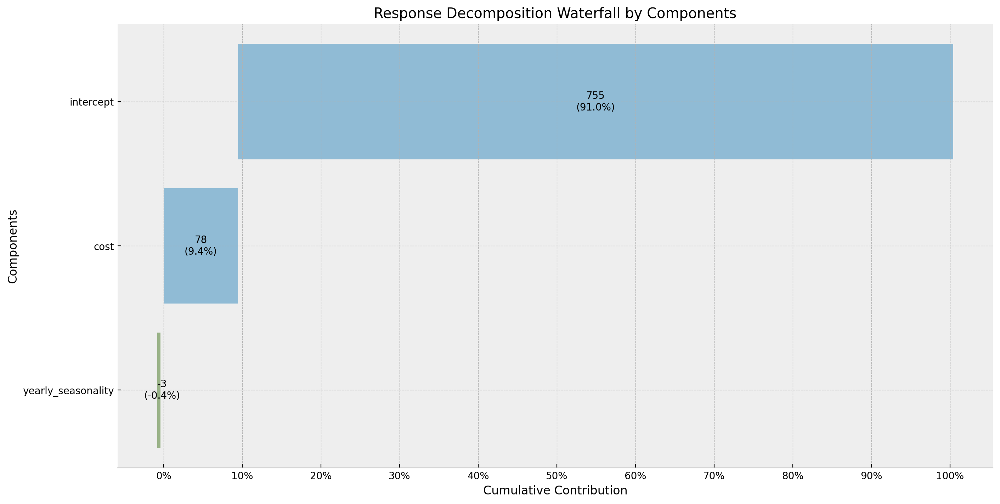

In [53]:
pymc_mmm.plot_waterfall_components_decomposition();

In [ ]:
pymc_mmm.plot_direct_contribution_curves()

---

## Time-varying Model

In this final model we add a time-varying coefficient for the adstock and saturation transformations (plus controlling for the trend and seasonality). Note that, we ensure the time varying coefficients are all positive by adding an `exp` transformation to the output of the Gaussian random walk.

- Model Specification

/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/pymc/data.py:304: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(
Sampling: [a, alpha, b_fourier, b_trend, lam, likelihood, nu, sigma, sigma_slope, slopes]


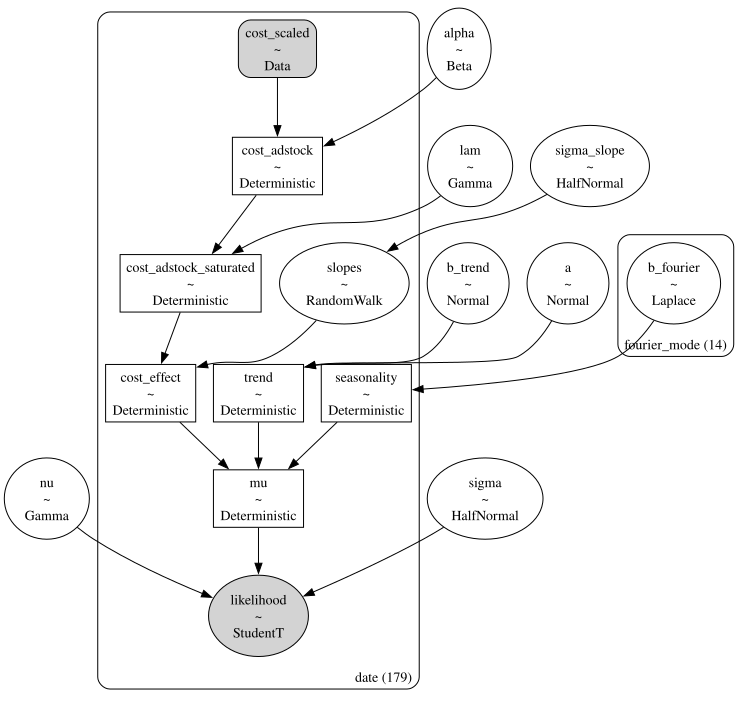

In [55]:
with pm.Model(coords=coords) as time_varying_model:
    # --- data containers ---
    cost_scaled_ = pm.MutableData(name="cost_scaled", value=cost_scaled, dims="date")

    # --- priors ---
    ## intercept
    a = pm.Normal(name="a", mu=0, sigma=4)
    ## trend
    b_trend = pm.Normal(name="b_trend", mu=0, sigma=2)
    ## seasonality
    b_fourier = pm.Laplace(name="b_fourier", mu=0, b=2, dims="fourier_mode")
    ## adstock effect
    alpha = pm.Beta(name="alpha", alpha=1, beta=1)
    ## saturation effect
    lam = pm.Gamma(name="lam", alpha=1, beta=1)
    ## gaussian random walk standard deviation
    sigma_slope = pm.HalfNormal(name="sigma_slope", sigma=0.05)
    ## standard deviation of the normal likelihood
    sigma = pm.HalfNormal(name="sigma", sigma=0.5)
    # degrees of freedom of the t distribution
    nu = pm.Gamma(name="nu", alpha=10, beta=1)

    # --- model parametrization ---
    trend = pm.Deterministic(name="trend", var=a + b_trend * t, dims="date")
    seasonality = pm.Deterministic(
        name="seasonality", var=pm.math.dot(fourier_features, b_fourier), dims="date"
    )
    slopes = pm.GaussianRandomWalk(
        name="slopes",
        sigma=sigma_slope,
        init_dist=pm.distributions.continuous.Normal.dist(
            name="init_dist", mu=0, sigma=2
        ),
        dims="date",
    )
    cost_adstock = pm.Deterministic(
        name="cost_adstock", var=geometric_adstock(x=cost_scaled_, alpha=alpha, l_max=12), dims="date"
    )
    cost_adstock_saturated = pm.Deterministic(
        name="cost_adstock_saturated",
        var=logistic_saturation(x=cost_adstock, lam=lam),
        dims="date",
    )
    cost_effect = pm.Deterministic(
        name="cost_effect", var=pm.math.exp(slopes) * cost_adstock_saturated, dims="date"
    )
    mu = pm.Deterministic(name="mu", var=trend + seasonality + cost_effect, dims="date")

    # --- likelihood ---
    pm.StudentT(name="likelihood", nu=nu, mu=mu, sigma=sigma, observed=sales_scaled, dims="date")

    # --- prior samples ---
    time_varying_model_prior_predictive = pm.sample_prior_predictive()

pm.model_to_graphviz(model=time_varying_model)

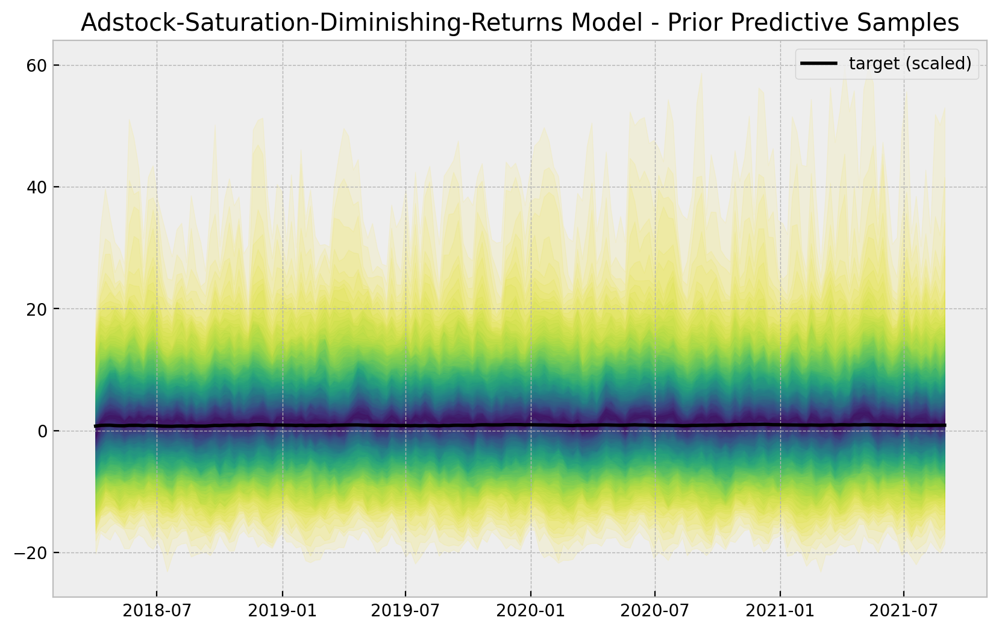

In [56]:
fig, ax = plt.subplots()

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(
        time_varying_model_prior_predictive.prior_predictive["likelihood"],
        p,
        axis=1,
    )
    lower = np.percentile(
        time_varying_model_prior_predictive.prior_predictive["likelihood"], 100 - p, axis=1
    )
    color_val = colors[i]
    ax.fill_between(
        x=date,
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(x=date, y=sales_scaled, color="black", label="target (scaled)", ax=ax)
ax.legend()
ax.set(title="Adstock-Saturation-Diminishing-Returns Model - Prior Predictive Samples");

- Model Fit

In [57]:
with time_varying_model:
    time_varying_model_trace = pm.sample(
        nuts_sampler="numpyro",
        draws=6_000,
        chains=4,
        idata_kwargs={"log_likelihood": True},
        progressbar=False,
    )
    time_varying_model_posterior_predictive = pm.sample_posterior_predictive(
        trace=time_varying_model_trace
    )

Sampling: [likelihood]


/Users/twiecki/micromamba/envs/pymc_pydata_2024/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

- Model Diagnostics

In [58]:
az.summary(
    data=time_varying_model_trace,
    var_names=["a", "b_trend", "sigma_slope", "alpha", "lam", "sigma", "nu"]
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,0.720,0.007,0.708,0.733,0.000,0.000,8461.0,12685.0,1.0
b_trend,0.184,0.008,0.169,0.199,0.000,0.000,2812.0,6838.0,1.0
sigma_slope,0.041,0.009,0.025,0.058,0.000,0.000,824.0,1700.0,1.0
alpha,0.511,0.028,0.457,0.562,0.000,0.000,3673.0,7193.0,1.0
lam,1.572,0.253,1.089,2.046,0.006,0.004,1838.0,1748.0,1.0
sigma,0.008,0.001,0.007,0.010,0.000,0.000,10664.0,13268.0,1.0
nu,11.341,3.121,5.904,17.244,0.019,0.014,26280.0,17917.0,1.0


As in the second model, the true values of $\alpha$ and $\lambda$ are included in the posterior distributions $94\%$ hdi (up to a scale as we will see below).

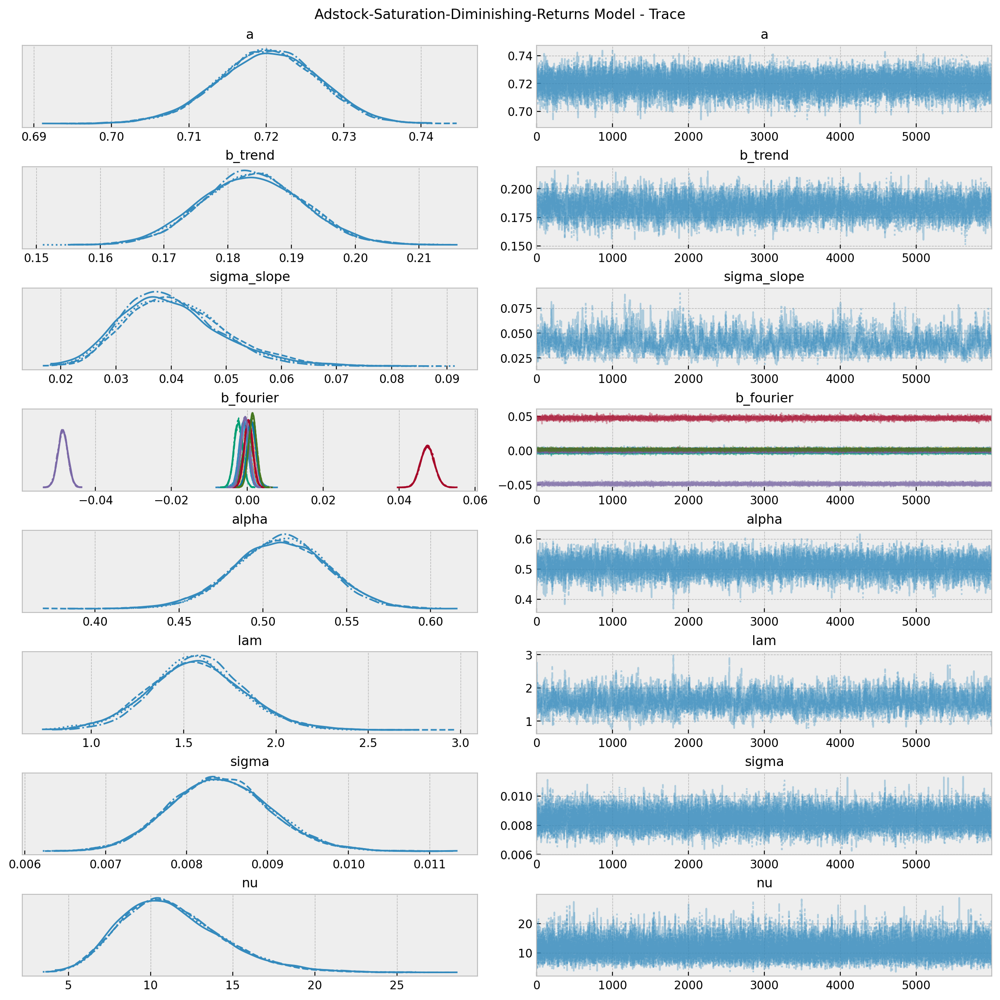

In [59]:
axes = az.plot_trace(
    data=time_varying_model_trace,
    var_names=[
        "a",
        "b_trend",
        "sigma_slope",
        "b_fourier",
        "alpha",
        "lam",
        "sigma",
        "nu",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 12), "layout": "constrained"},
)
fig = axes[0][0].get_figure()
fig.suptitle("Adstock-Saturation-Diminishing-Returns Model - Trace");

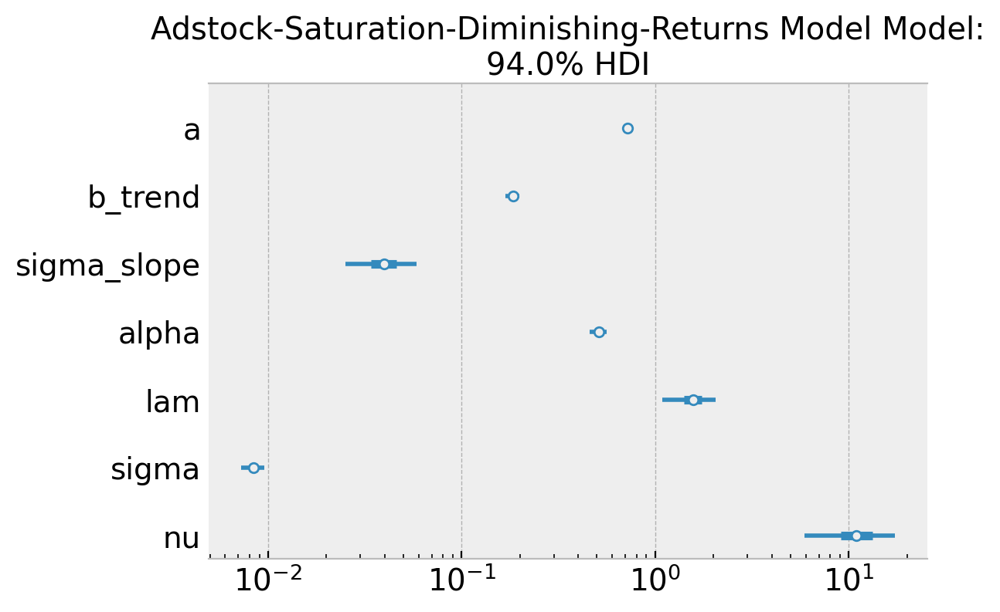

In [60]:
fig, ax = plt.subplots(figsize=(6, 4))
az.plot_forest(
    data=time_varying_model_trace,
    var_names=["a", "b_trend", "sigma_slope", "alpha", "lam", "sigma", "nu"],
    combined=True,
    ax=ax
)
ax.set(
    title="Adstock-Saturation-Diminishing-Returns Model Model: 94.0% HDI",
    xscale="log"
);

In [ ]:
plt.plot(np.exp(az.extract(time_varying_model_trace.posterior)["slopes"]), color="0.5", alpha=.1);
plt.xlabel("time"); plt.ylabel("cost_effect");

- Posterior Predictive Samples

In [ ]:
posterior_predictive_likelihood = az.extract(
    data=time_varying_model_posterior_predictive,
    group="posterior_predictive",
    var_names="likelihood",
)

posterior_predictive_likelihood_inv = sales_scaler.inverse_transform(
    X=posterior_predictive_likelihood
)

fig, ax = plt.subplots()

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(posterior_predictive_likelihood_inv, p, axis=1)
    lower = np.percentile(posterior_predictive_likelihood_inv, 100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(
        x=date,
        y1=upper,
        y2=lower,
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(
    x=date,
    y=posterior_predictive_likelihood_inv.mean(axis=1),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)
sns.lineplot(
    x=date,
    y=sales,
    color="black",
    label="target",
    ax=ax,
)
ax.legend(loc="upper left")
ax.set(title="Adstock-Saturation-Diminishing-Returns Model - Posterior Predictive");

In [ ]:
# compute HDI for all the model parameters
model_hdi = az.hdi(ary=time_varying_model_trace)

fig, ax = plt.subplots()

for i, var_effect in enumerate(["cost_effect", "trend", "seasonality"]):
    ax.fill_between(
        x=date,
        y1=model_hdi[var_effect][:, 0],
        y2=model_hdi[var_effect][:, 1],
        color=f"C{i}",
        alpha=0.3,
        label=f"$94\%$ HDI ({var_effect})",
    )
    sns.lineplot(
        x=date,
        y=time_varying_model_trace.posterior[var_effect]
        .stack(sample=("chain", "draw"))
        .mean(axis=1),
        color=f"C{i}",
    )

sns.lineplot(
    x=date, y=sales_scaled, color="black", alpha=1.0, label="target (scaled)", ax=ax
)
ax.legend(title="components", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(
    title="Adstock-Saturation-Diminishing-Return Model Components",
    ylabel="target (scaled)",
);

Now we want to deep dive into the parameters $\alpha$ and $\lambda$ of the adstock and saturation transformations respectively. First, let us look into their joint posterior distributions.

In [ ]:
alpha_true = 0.5
lam_true = 0.15
lam_true_scaled = 0.15 * cost_scaler.scale_.item()

fig, ax = plt.subplots(figsize=(6, 5))
az.plot_pair(
    data=time_varying_model_trace,
    var_names=["alpha", "lam"],
    kind="kde",
    divergences=True,
    ax=ax
)
ax.axhline(lam_true_scaled, color="C1", linestyle="--", label="$\lambda_{true} (scaled)$")
ax.axvline(alpha_true, color="C4", linestyle="--", label="$\\alpha_{true}$")
ax.legend(title="true params", loc="upper right")
ax.set(
    title="Adstock-Saturation-Diminishing-Returns Model",
    xlabel="$\\alpha$",
    ylabel="$\lambda$"
);

The true values are quite close to the posterior mode. Note that there seems to be a weak negative correlation between these two parameters.

- Estimated `cost_effect`

Let us look into the estimated effect of `cost` on `sales` inferred by the model against the true one from the data generation process.

In [ ]:
cost_effect_posterior_samples = xr.apply_ufunc(
    lambda x: sales_scaler.inverse_transform(X=x.reshape(1, -1)),
    time_varying_model_trace.posterior["cost_effect"],
    input_core_dims=[["date"]],
    output_core_dims=[["date"]],
    vectorize=True,
)

cost_effect_hdi = az.hdi(ary=cost_effect_posterior_samples)["cost_effect"]

fig, ax = plt.subplots()
ax.fill_between(
    x=date,
    y1=cost_effect_hdi[:, 0],
    y2=cost_effect_hdi[:, 1],
    color="C0",
    alpha=0.5,
    label="cost_effect 94% HDI",
)
ax.axhline(
    y=cost_effect_posterior_samples.mean(),
    color="C0",
    linestyle="--",
    label=f"posterior mean {cost_effect_posterior_samples.mean().values: 0.3f}",
)
sns.lineplot(x="date", y="cost_effect", color="C3", data=data_df, label="cost_effect", ax=ax)
ax.legend(loc="upper right")
ax.set(
    title="Media Cost Effect Estimation - Adstock-Saturation-Diminishing-Returns Model"
);

As expected, we get a very good fit. In particular, the model is capturing the time-varying effect as a result of the gaussian random walk component. As above, we can now look into the estimated vs true scatter plot.

In [ ]:
fig, ax = plt.subplots()

sns.scatterplot(
    x="cost",
    y="cost_effect_pred_mean",
    color="C0",
    label="cost_effect (pred mean)",
    data=data_df.assign(
        cost_effect_pred_mean=cost_effect_posterior_samples.mean(dim=("chain", "draw"))
    ),
    ax=ax,
)
sns.scatterplot(
    x="cost", y="cost_effect", color="C3", label="cost_effect (true)", data=data_df
)
h, l = ax.get_legend_handles_labels()
ax.legend(handles=h[:9], labels=l[:9], loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Adstock-Saturation-Diminishing-Returns Model - Estimated Effect");

It is interesting to see that the non-linear pattern does not look precisely as a logistic saturation. One of the main reasons for this is the diminishing returns in the time component. We can better see the logistic-like saturation if we factor the time component, for example by splitting by year:

In [ ]:
cost_effect_hdi = az.hdi(ary=cost_effect_posterior_samples)["cost_effect"]

data_df = data_df.assign(
    cost_effect_pred_mean=cost_effect_posterior_samples.mean(dim=("chain", "draw")),
    cost_effect_hdi_lower=cost_effect_hdi[:, 0],
    cost_effect_hdi_upper=cost_effect_hdi[:, 1],
)

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=2, figsize=(10, 9), sharex=True, sharey=True, layout="constrained"
)

axes = axes.flatten()

for i, year in enumerate(data_df["year"].sort_values().unique()):
    ax = axes[i]
    mask = f"year == {year}"

    yerr = (
        data_df.query(mask)["cost_effect_hdi_upper"]
        - data_df.query(mask)["cost_effect_hdi_lower"]
    )

    markers, caps, bars = ax.errorbar(
        x=data_df.query(mask)["cost"],
        y=data_df.query(mask)["cost_effect_pred_mean"],
        yerr=yerr / 2,
        color="C0",
        fmt="o",
        ms=0,
        capsize=5,
        label="estimated effect",
    )
    [bar.set_alpha(0.3) for bar in bars]
    sns.regplot(
        x="cost",
        y="cost_effect_pred_mean",
        order=2,
        color="C0",
        label="pred mean effect",
        data=data_df.query(mask),
        ax=ax,
    )
    sns.regplot(
        x="cost",
        y="cost_effect",
        order=2,
        color="C3",
        label="true effect",
        data=data_df.query(mask),
        ax=ax,
    )
    if i == 0:
        ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=3)
    else:
        ax.legend().remove()
    ax.set(title=f"{year}")

fig.suptitle("Media Cost Effect Estimation - time_varying Model", y=1.05);

The results look very good! These are exactly the curves we would need for decision making and budget allocation.

**Remark:** Note that this plot looks very similar to the one obtained in the post [Media Effect Estimation with Orbit's KTR Model](https://juanitorducost.github.io/orbit_mmm/). The main difference is that in the previous post we could only estimated the effect of `cost_adstock` on `sales` while in this one we estimate the effect of `cost` on `sales` directly by learning the adstock effect from the data.

## Model Comparison

To end this notebook, let us compare the three models.

In [ ]:
dataset_dict = {
    "base_model": base_model_trace,
    "trend_seasonal_model": trend_seasonal_model_trace,
    "adstock_saturation_model": adstock_saturation_model_trace,
    "time_varying_model": time_varying_model_trace,
}

az.compare(compare_dict=dataset_dict, ic="loo", method="stacking", scale="log")

We clearly see that the `time_varying_model` is the best one (no surprise here). Let's finally compare the posterior distributions for the three models. 

In [ ]:
axes = az.plot_forest(
    data=[base_model_trace, adstock_saturation_model_trace, time_varying_model_trace],
    model_names=["base_model", "trend_seasonal_model", "adstock_saturation_model", "time_varying_model"],
    var_names=["a", "b_trend", "b_cost", "sigma_slope", "alpha", "lam", "sigma"],
    combined=True,
    figsize=(10, 7),
);

In [ ]:
axes = az.plot_forest(
    data=[base_model_trace, adstock_saturation_model_trace, time_varying_model_trace],
    model_names=["base_model", "trend_seasonal_model", "adstock_saturation_model", "time_varying_model"],
    var_names=["nu"],
    combined=True,
    figsize=(8, 3),
);

Finally, let's compare the estimated ROAS and mROAS of all models. First we collect the samples: